In [1]:
from pydub import AudioSegment

audio = AudioSegment.from_file("1.m4a")

three_ms = 3

audio_segment = audio[:three_ms]

# Export the 3ms segment
audio_segment.export("output_3ms.wav", format="wav")

print("Audio segment of 3 ms has been saved as 'output_3ms.wav'.")


Audio segment of 3 ms has been saved as 'output_3ms.wav'.


In [4]:
import numpy as np

In [5]:
# Example for plotting a spectrogram using this function
import audiosegment
import matplotlib.pyplot as plt
seg = audiosegment.from_file("1.m4a")
freqs, times, amplitudes = seg.spectrogram(window_length_s=0.02, overlap=0.01)
amplitudes = 10 * np.log10(amplitudes + 1e-7)


In [6]:
amplitudes

array([[-70.       , -70.       ,  -5.262353 , ...,  14.023012 ,
         15.220243 ,  10.9097595],
       [-70.       , -70.       ,  11.750127 , ...,  20.48901  ,
         21.662727 ,  20.940876 ],
       [-70.       , -70.       ,  13.00701  , ...,  18.378405 ,
         22.8938   ,  21.206694 ],
       ...,
       [-70.       , -70.       , -29.174795 , ..., -17.836504 ,
        -20.703756 , -26.519165 ],
       [-70.       , -70.       , -21.06817  , ..., -19.06029  ,
        -23.22351  , -20.557201 ],
       [-70.       , -70.       , -18.591738 , ..., -25.218544 ,
        -22.228308 , -34.030907 ]], dtype=float32)

In [10]:
amplitudes[0]

array([-70.        , -70.        ,  -5.262353  ,   8.39651   ,
         0.386316  ,  -9.28712   ,  13.350113  ,  12.966981  ,
        16.917082  ,  15.054432  ,  20.446156  ,  17.867723  ,
        20.457916  ,  15.960014  ,   8.1699    ,  21.14698   ,
        20.319841  ,  16.617506  ,  19.686634  ,  13.512992  ,
        12.397443  ,  15.934761  ,  13.346401  ,  15.304545  ,
        10.945957  ,  17.000217  ,   8.73032   ,  15.731812  ,
        21.427145  ,  11.714248  ,  15.315573  ,   0.16115493,
         8.403235  ,  15.519409  ,   2.39816   ,  13.242358  ,
        19.021872  ,  14.407372  ,  19.983196  ,  17.767601  ,
        18.64621   ,  19.081192  ,   9.885989  ,  19.056335  ,
        19.17474   ,  19.06686   ,  17.606617  ,  10.528158  ,
        16.28614   ,  23.894493  ,  24.99744   ,  22.888021  ,
        21.282349  ,  15.6550255 ,  23.307835  ,  23.969059  ,
        17.762392  ,  16.588877  ,  11.982269  ,  13.332745  ,
         9.309467  ,  13.042679  ,  12.280285  ,   7.50

C:\Users\Admin\AppData\Local\Temp\ipykernel_2652\1172637339.py:8: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None)
C:\Users\Admin\anaconda3\lib\site-packages\librosa\core\audio.py:184: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)


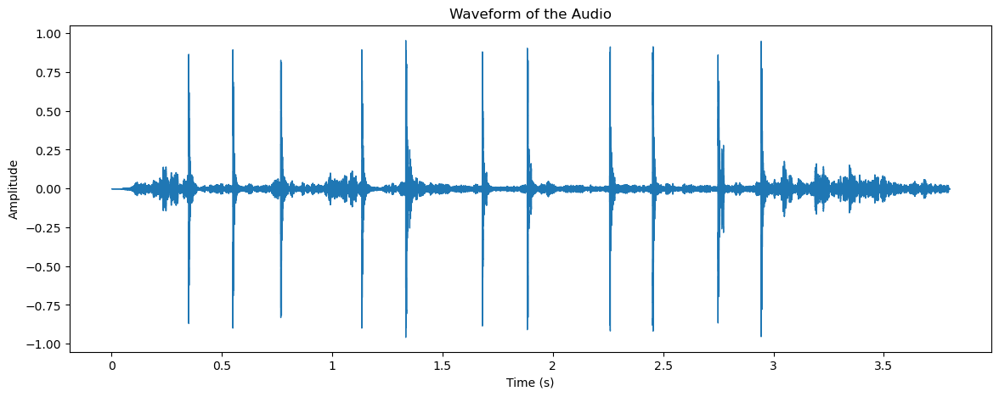

In [1]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load the audio file (replace 'your_audio_file.wav' with the actual file path)
audio_file = '1.m4a'
y, sr = librosa.load(audio_file, sr=None)

# Plot the waveform
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title("Waveform of the Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


In [8]:
a = y[y>0.8]
len(a)

10

Saved segment_1.wav


C:\Users\Admin\AppData\Local\Temp\ipykernel_2652\1764121899.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None)


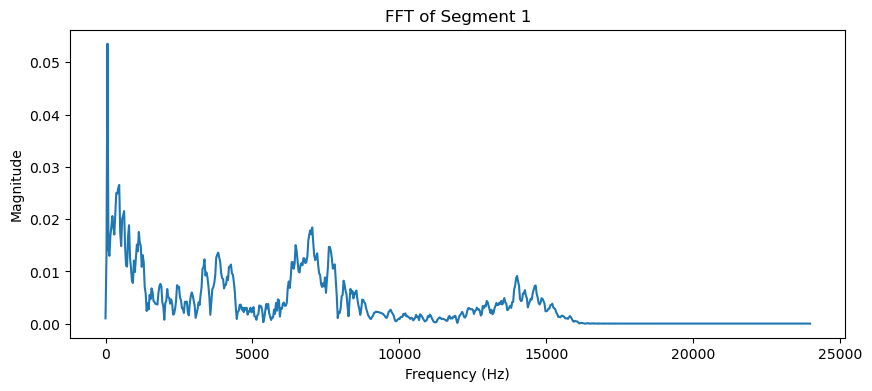

Saved segment_2.wav


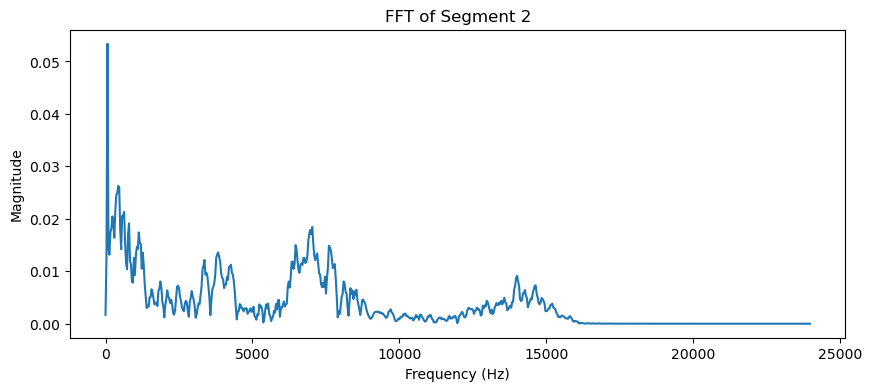

Saved segment_3.wav


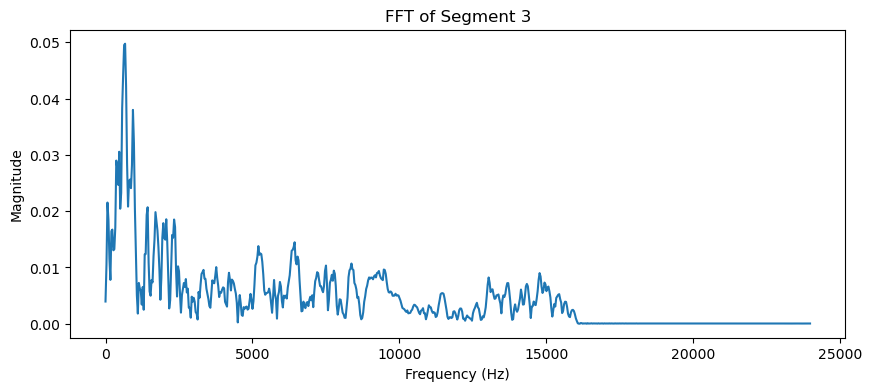

Saved segment_4.wav


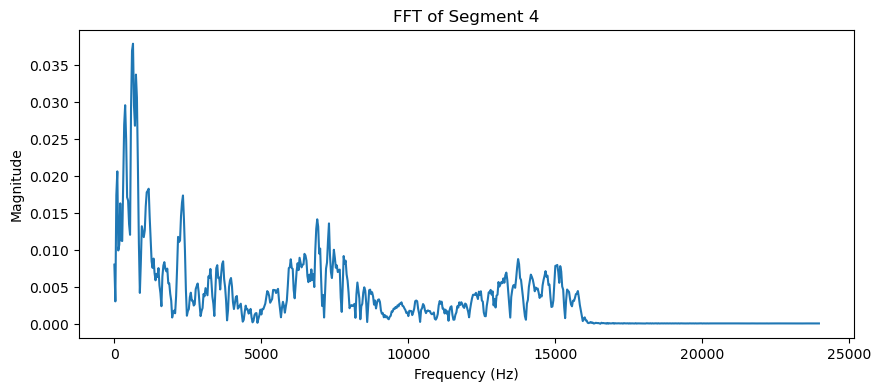

Saved segment_5.wav


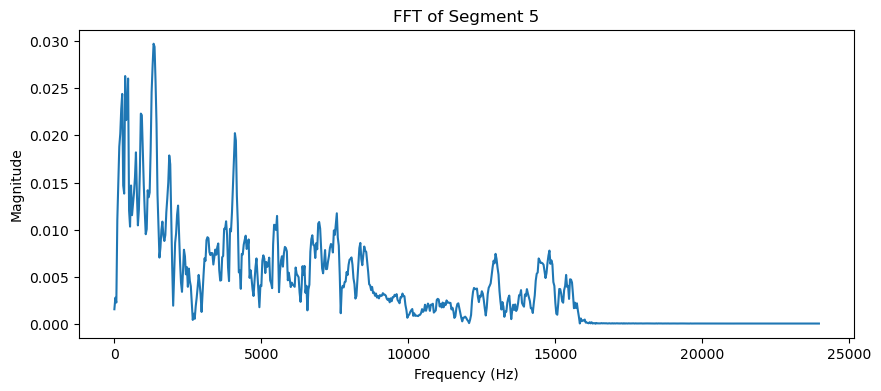

Saved segment_6.wav


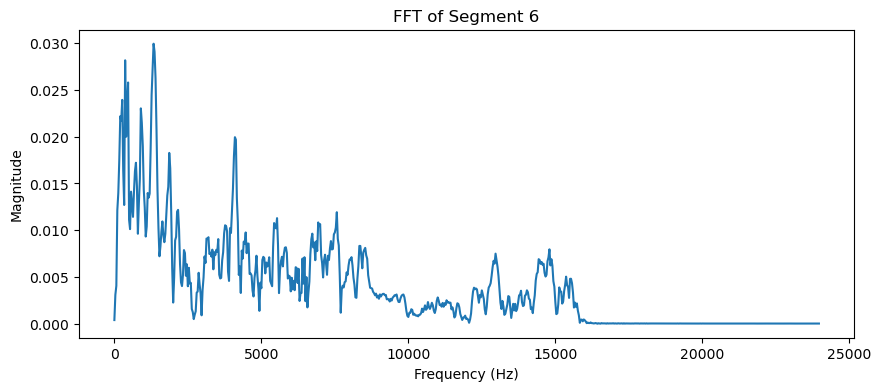

Saved segment_7.wav


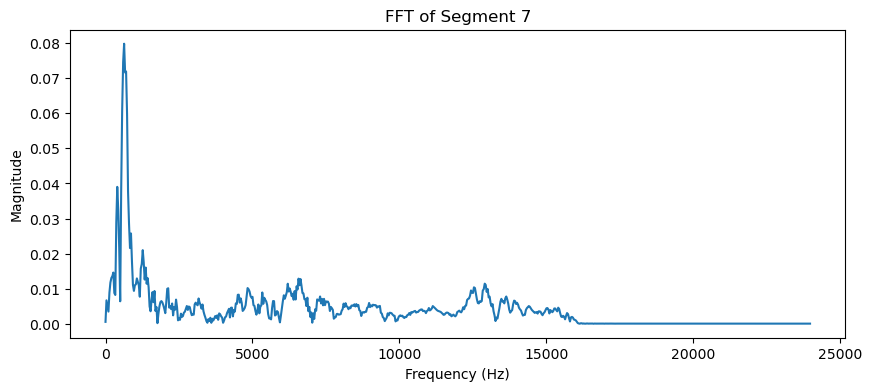

Saved segment_8.wav


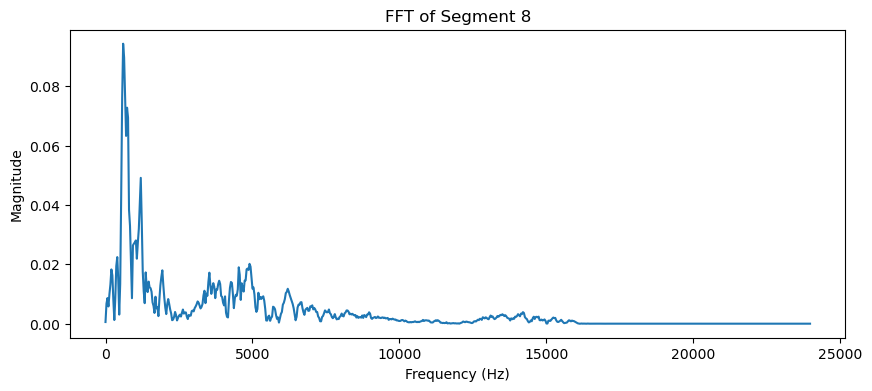

Saved segment_9.wav


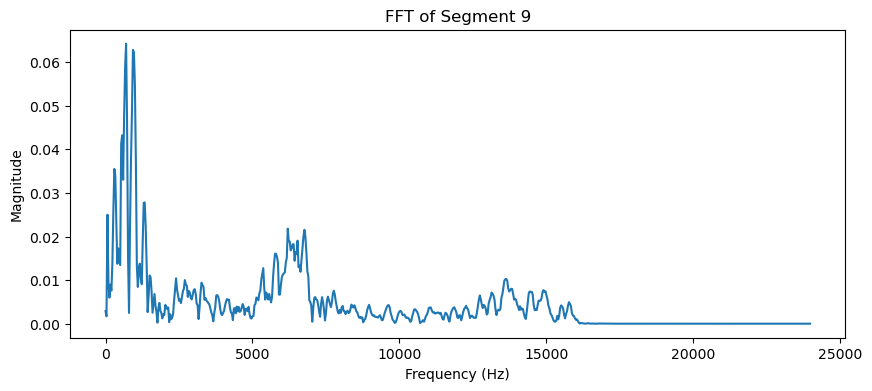

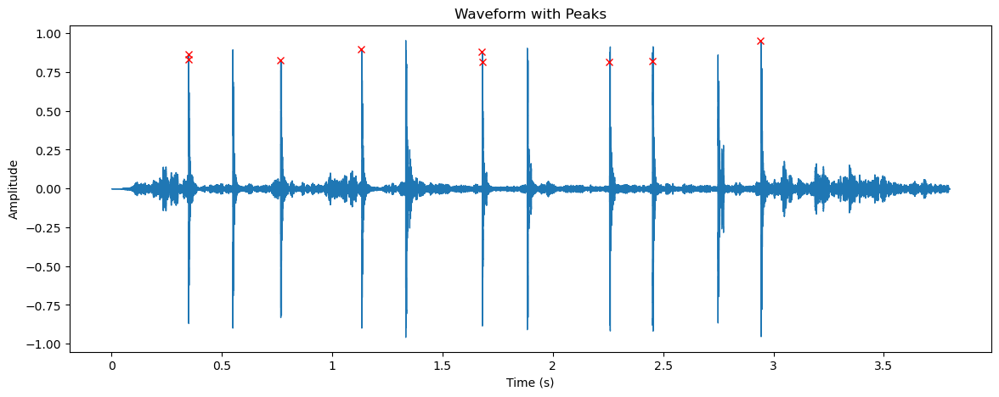

In [74]:
import librosa
import soundfile as sf  # Import soundfile for saving audio files
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks
from scipy.fft import fft, fftfreq

# Load the audio file (replace with your audio file)
audio_file = '1.m4a'
y, sr = librosa.load(audio_file, sr=None)

# Find peaks in the waveform
peaks, _ = find_peaks(y, height=0.8147888,prominence=0.3)  # Adjust height for sensitivity to peaks

# Duration of the segment in seconds
segment_duration = 0.03  # 30 ms
segment_samples = int(segment_duration * sr)  # Number of samples for 0.03s

# Half the segment length (0.015s before and after the peak)
half_segment_samples = segment_samples // 2

# Extract and save segments around each peak
segments = []
for idx, peak in enumerate(peaks):
    start = max(0, peak - half_segment_samples)
    end = min(len(y), peak + half_segment_samples)
    segment = y[start:end]
    segments.append(segment)
    
    # Save the segment to a .wav file
    output_filename = f"segment_{idx+1}.wav"
    sf.write(output_filename, segment, sr)
    print(f"Saved {output_filename}")

    # Perform FFT on the segment
    N = len(segment)
    T = 1.0 / sr  # Sampling interval
    yf = fft(segment)  # FFT of the segment
    xf = fftfreq(N, T)[:N // 2]  # Frequency bins

    # Find peaks in the magnitude of the FFT
    magnitude = 2.0 / N * np.abs(yf[:N // 2])  # Magnitude spectrum
    fft_peaks, _ = find_peaks(magnitude, height=0.1)  # Adjust height threshold if needed

    # Plot the magnitude spectrum and mark the FFT peaks
    plt.figure(figsize=(10, 4))
    plt.plot(xf, magnitude)
    plt.plot(xf[fft_peaks], magnitude[fft_peaks], "x", color='r')  # Mark FFT peaks with red 'x'
    plt.title(f"FFT of Segment {idx+1}")
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.show()

# Optionally, plot the waveform and mark the peaks
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.plot(peaks / sr, y[peaks], "x", color='r')  # Mark peaks with red 'x'
plt.title("Waveform with Peaks")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


In [73]:
y[peaks]


array([0.86727905, 0.8329773 , 0.8288574 , 0.89682007, 0.88308716,
       0.81604004, 0.8147888 , 0.8184204 , 0.9515991 ], dtype=float32)

In [58]:
peaks, _ = find_peaks(y, height=0.7785034)

SyntaxError: invalid syntax (2021161903.py, line 1)

In [55]:
max(y)

0.9515991

In [48]:
peaks/sr

array([0.34804167, 0.3483125 , 0.76541667, 1.13264583, 1.3333125 ,
       1.33510417, 1.679125  , 1.68054167, 2.2559375 , 2.4501875 ,
       2.45025   , 2.453     , 2.94172917, 2.9420625 ])

C:\Users\Admin\AppData\Local\Temp\ipykernel_2652\367003348.py:9: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None)


Saved segment_1.wav
Saved segment_2.wav
Saved segment_3.wav
Saved segment_4.wav
Saved segment_5.wav
Saved segment_6.wav
Saved segment_7.wav
Saved segment_8.wav
Saved segment_9.wav
Saved segment_10.wav
Saved segment_11.wav
Saved segment_12.wav
Saved segment_13.wav
Saved segment_14.wav
Saved segment_15.wav
Saved segment_16.wav
Saved segment_17.wav
Saved segment_18.wav
Saved segment_19.wav
Saved segment_20.wav
Saved segment_21.wav
Saved segment_22.wav
Saved segment_23.wav
Saved segment_24.wav
Saved segment_25.wav
Saved segment_26.wav
Saved segment_27.wav
Saved segment_28.wav
Saved segment_29.wav
Saved segment_30.wav
Saved segment_31.wav
Saved segment_32.wav
Saved segment_33.wav
Saved segment_34.wav
Saved segment_35.wav
Saved segment_36.wav
Saved segment_37.wav
Saved segment_38.wav
Saved segment_39.wav
Saved segment_40.wav


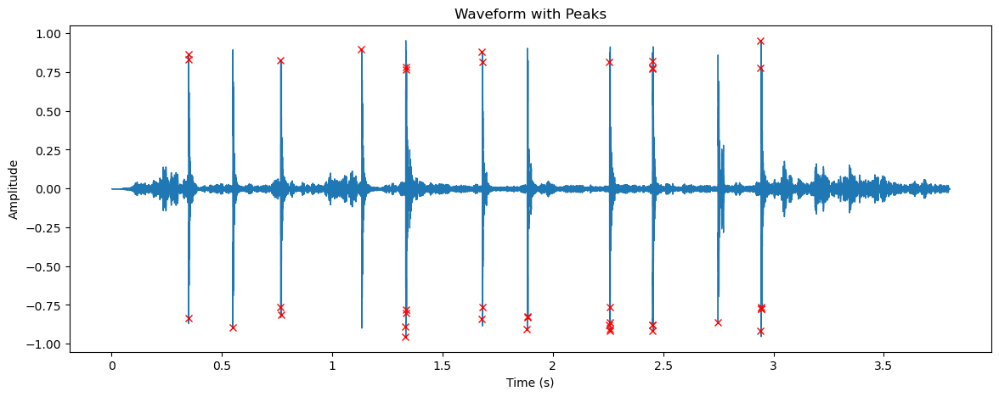

In [18]:
import librosa
import soundfile as sf  # Import soundfile for saving audio files
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load the audio file (replace with your audio file)
audio_file = '1.m4a'
y, sr = librosa.load(audio_file, sr=None)

# Find peaks in the waveform
peaks, _ = find_peaks(np.abs(y), height=0.75)  # Adjust height for sensitivity to peaks

# Duration of the segment in seconds
segment_duration = 0.03  # 30 ms
segment_samples = int(segment_duration * sr)  # Number of samples for 0.03s

# Half the segment length (0.015s before and after the peak)
half_segment_samples = segment_samples // 2

# Extract and save segments around each peak
segments = []
for idx, peak in enumerate(peaks):
    start = max(0, peak - half_segment_samples)
    end = min(len(y), peak + half_segment_samples)
    segment = y[start:end]
    segments.append(segment)
    
    # Save the segment to a .wav file
    output_filename = f"segment_{idx+1}.wav"
    sf.write(output_filename, segment, sr)
    print(f"Saved {output_filename}")

# Optionally, plot the waveform and mark the peaks
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.plot(peaks / sr, y[peaks], "x", color='r')  # Mark peaks with red 'x'
plt.title("Waveform with Peaks")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_2652\2168100130.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None)


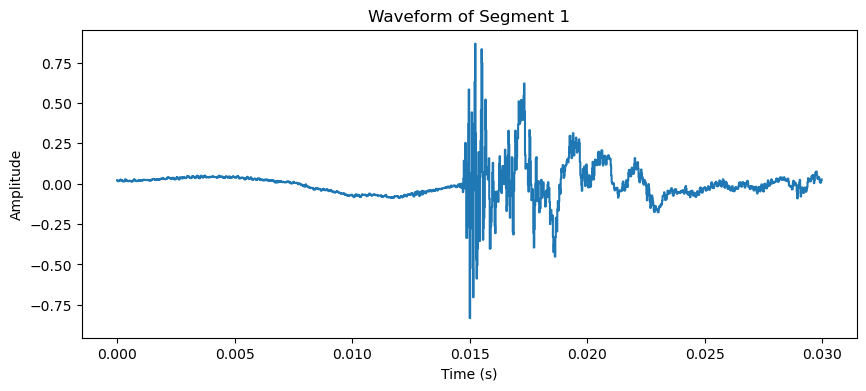

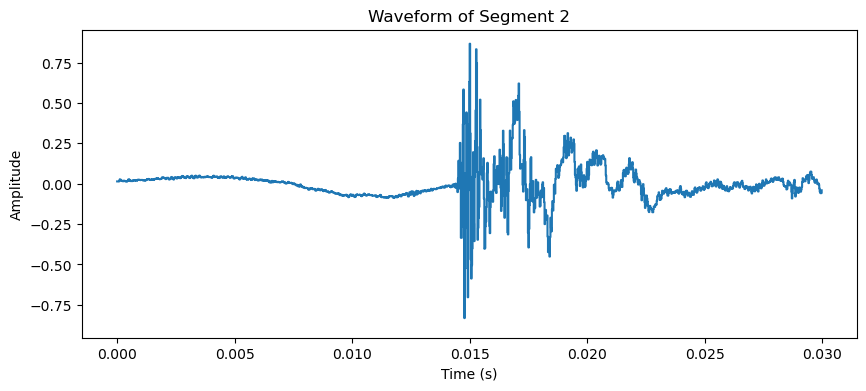

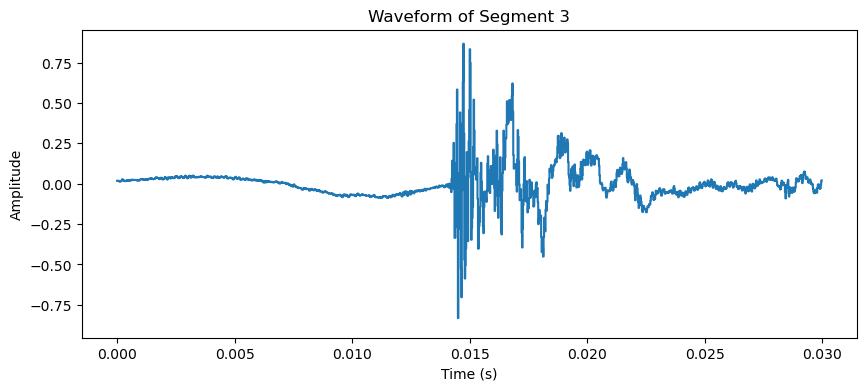

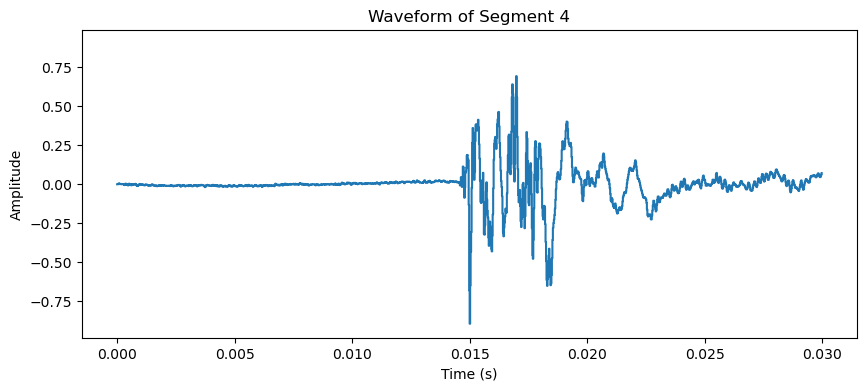

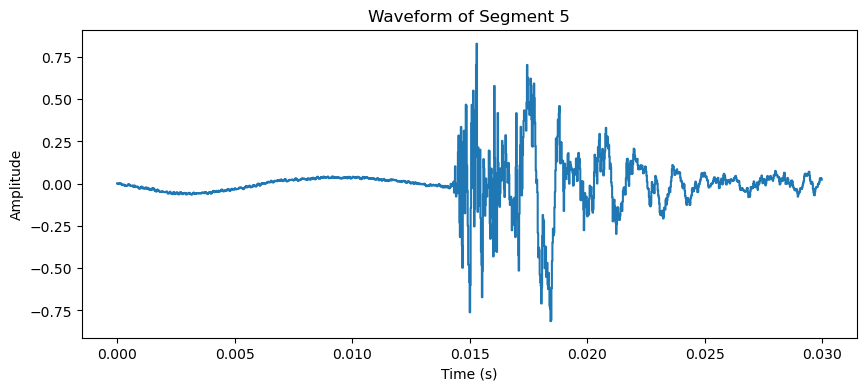

...

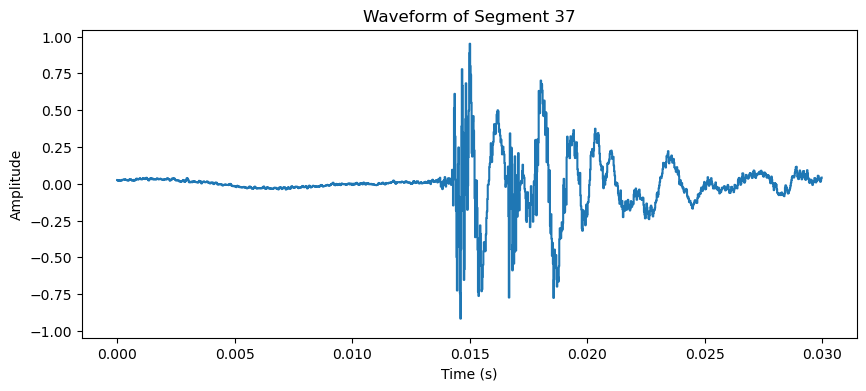

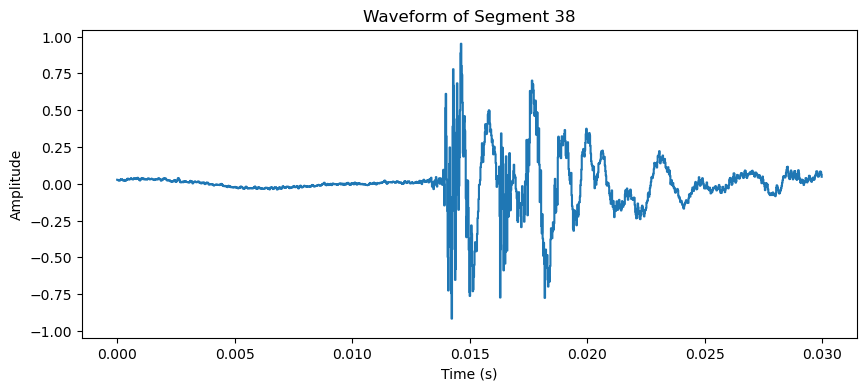

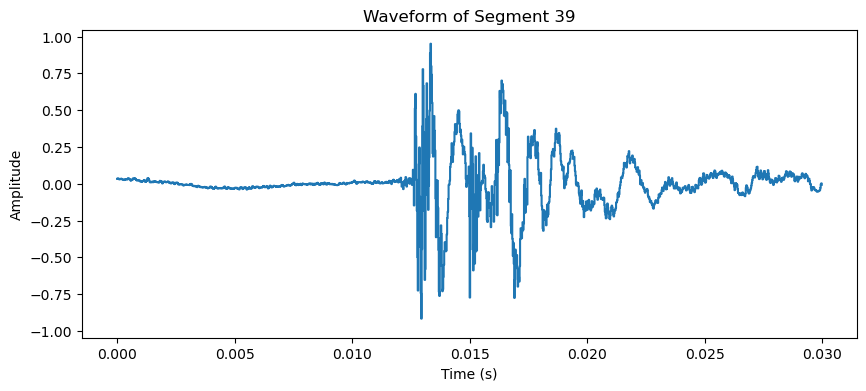

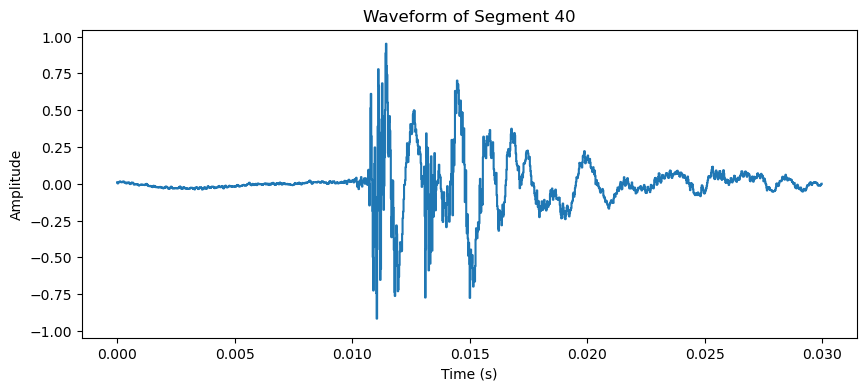

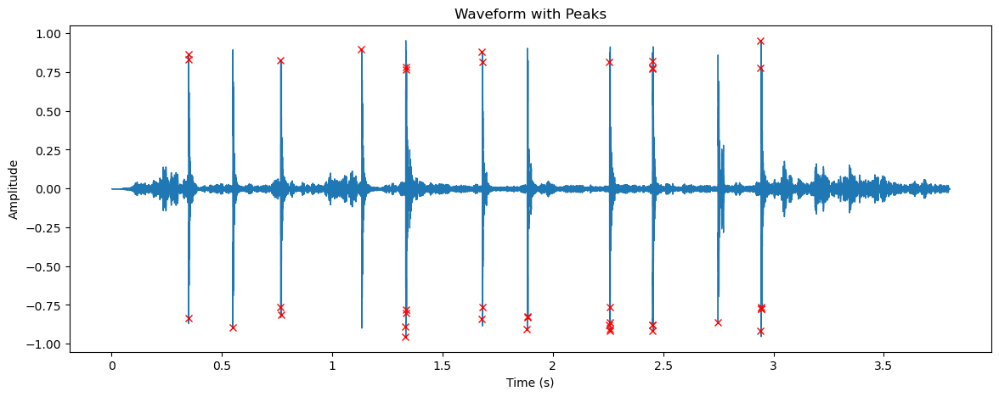

In [20]:
import librosa
import soundfile as sf  # For saving .wav files
from pydub import AudioSegment  # For converting to .m4a
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load the audio file (replace with your audio file)
audio_file = '1.m4a'
y, sr = librosa.load(audio_file, sr=None)

# Find peaks in the waveform
peaks, _ = find_peaks(np.abs(y), height=0.75)  # Adjust height for sensitivity to peaks

# Duration of the segment in seconds
segment_duration = 0.03  # 30 ms
segment_samples = int(segment_duration * sr)  # Number of samples for 0.03s

# Half the segment length (0.015s before and after the peak)
half_segment_samples = segment_samples // 2

# Extract, save, and plot each segment
segments = []
for idx, peak in enumerate(peaks):
    start = max(0, peak - half_segment_samples)
    end = min(len(y), peak + half_segment_samples)
    segment = y[start:end]
    segments.append(segment)
    
    # Save the segment to a .wav file first
    wav_filename = f"segment_{idx+1}.wav"
    sf.write(wav_filename, segment, sr)
    
#     # Convert the .wav to .m4a using pydub
#     m4a_filename = f"segment_{idx+1}.m4a"
#     audio_segment = AudioSegment.from_wav(wav_filename)
#     audio_segment.export(m4a_filename, format="m4a")
    
#     print(f"Saved {m4a_filename}")
    
    # Plot the waveform of each segment
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(segment, sr=sr)
    plt.title(f"Waveform of Segment {idx+1}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

# Optionally, plot the overall waveform with marked peaks
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.plot(peaks / sr, y[peaks], "x", color='r')  # Mark peaks with red 'x'
plt.title("Waveform with Peaks")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_2652\3725744968.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None)


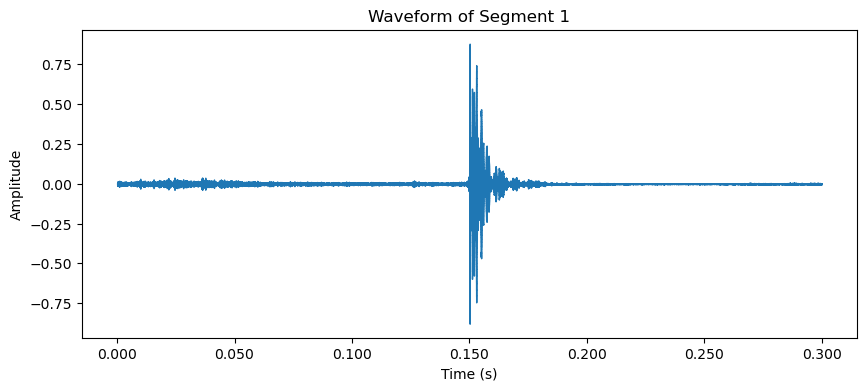

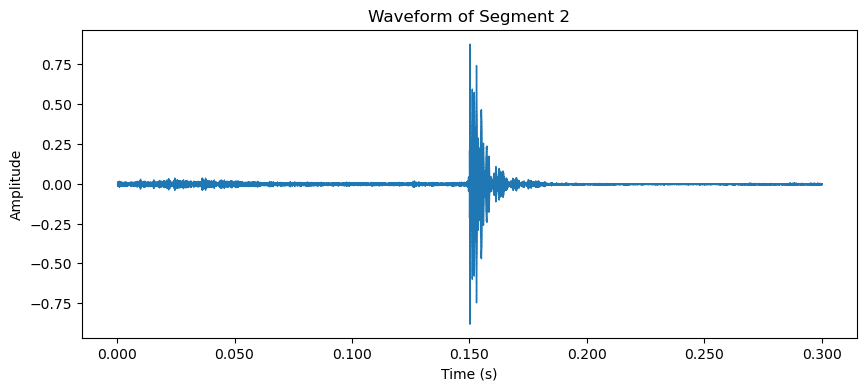

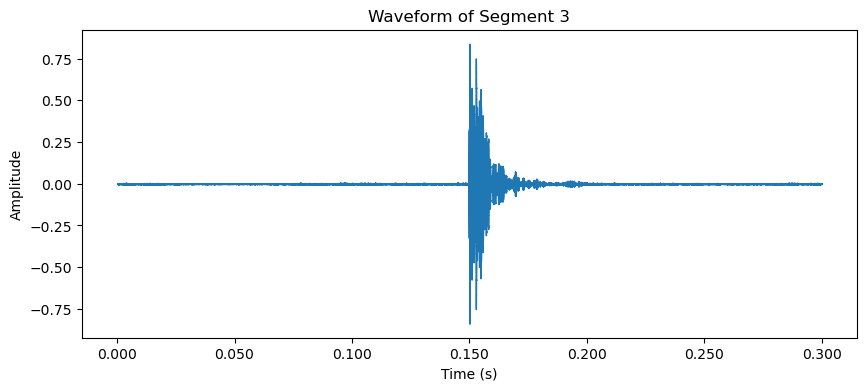

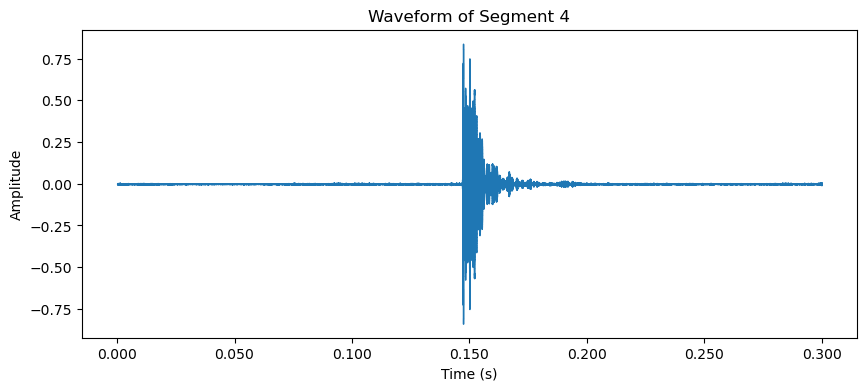

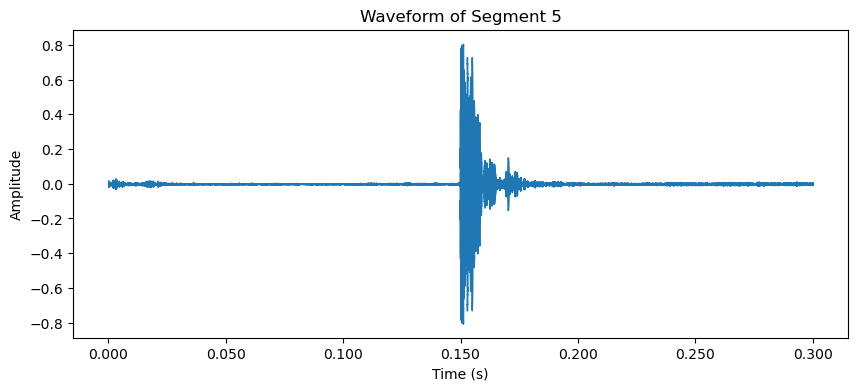

...

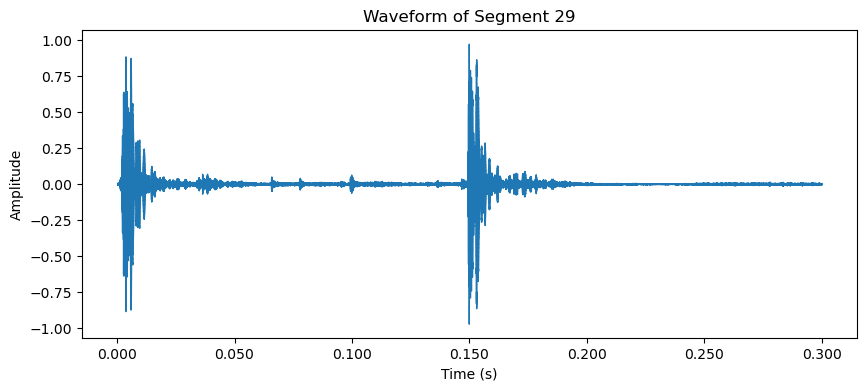

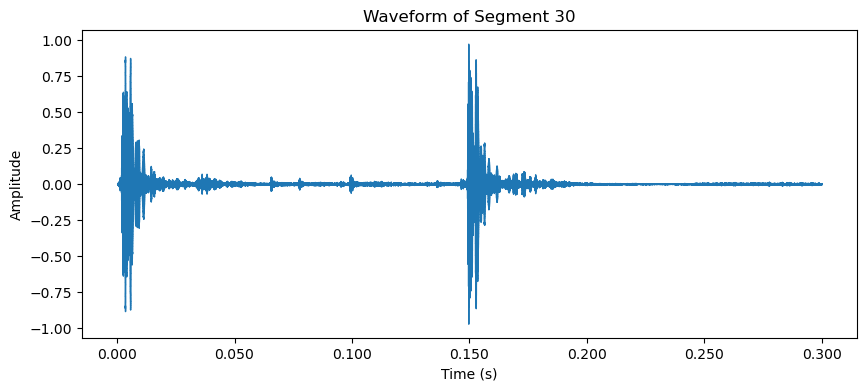

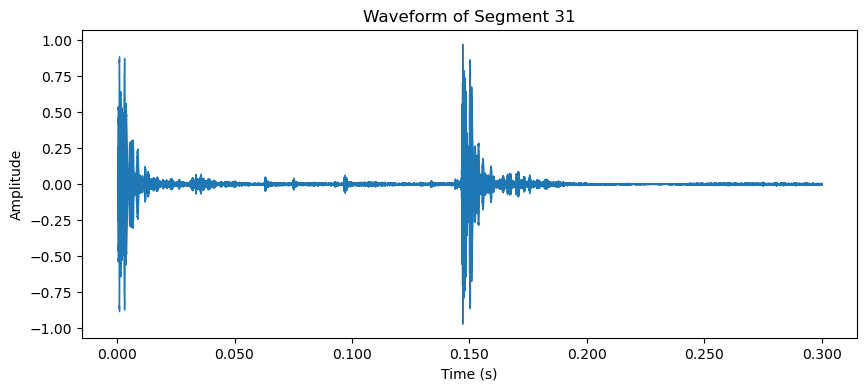

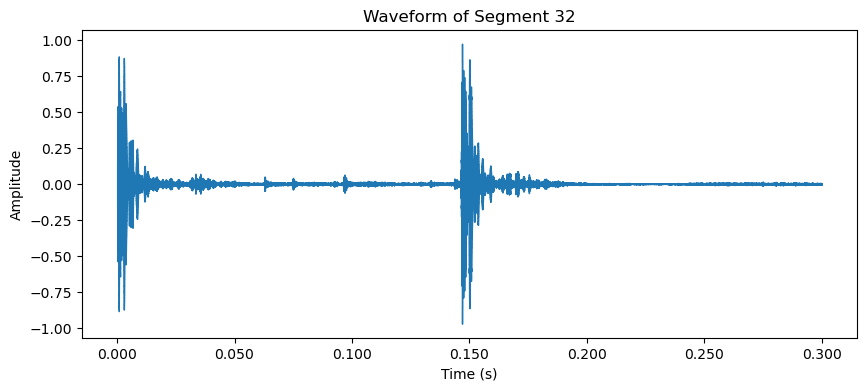

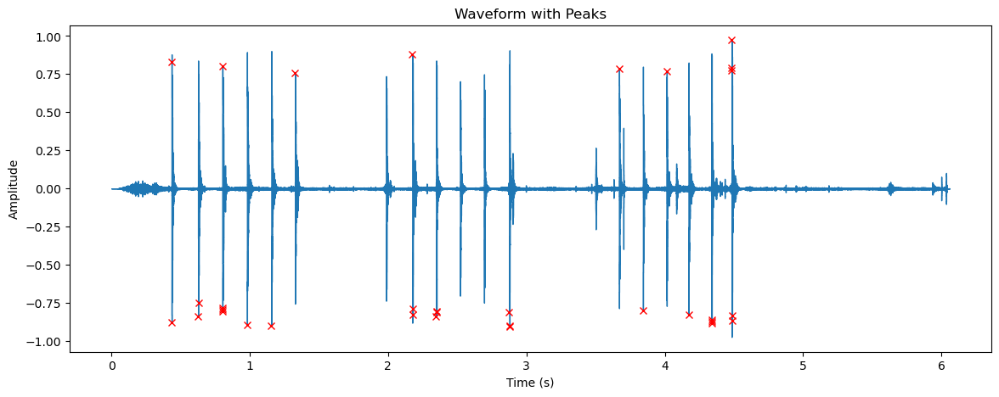

In [29]:
import librosa
import soundfile as sf  # For saving .wav files
from pydub import AudioSegment  # For converting to .m4a
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load the audio file (replace with your audio file)
audio_file = '12.m4a'
y, sr = librosa.load(audio_file, sr=None)

# Find peaks in the waveform
peaks, _ = find_peaks(np.abs(y), height=0.75)  # Adjust height for sensitivity to peaks

# Duration of the segment in seconds
segment_duration = 0.3  # 30 ms
segment_samples = int(segment_duration * sr)  # Number of samples for 0.03s

# Half the segment length (0.015s before and after the peak)
half_segment_samples = segment_samples // 2

# Extract, save, and plot each segment
segments = []
for idx, peak in enumerate(peaks):
    start = max(0, peak - half_segment_samples)
    end = min(len(y), peak + half_segment_samples)
    segment = y[start:end]
    segments.append(segment)
    
    # Save the segment to a .wav file first
    wav_filename = f"segment_{idx+1}.wav"
    sf.write(wav_filename, segment, sr)
    
#     # Convert the .wav to .m4a using pydub
#     m4a_filename = f"segment_{idx+1}.m4a"
#     audio_segment = AudioSegment.from_wav(wav_filename)
#     audio_segment.export(m4a_filename, format="m4a")
    
#     print(f"Saved {m4a_filename}")
    
    # Plot the waveform of each segment
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(segment, sr=sr)
    plt.title(f"Waveform of Segment {idx+1}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

# Optionally, plot the overall waveform with marked peaks
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.plot(peaks / sr, y[peaks], "x", color='r')  # Mark peaks with red 'x'
plt.title("Waveform with Peaks")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


C:\Users\Admin\AppData\Local\Temp\ipykernel_2652\2962294585.py:10: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_file, sr=None)


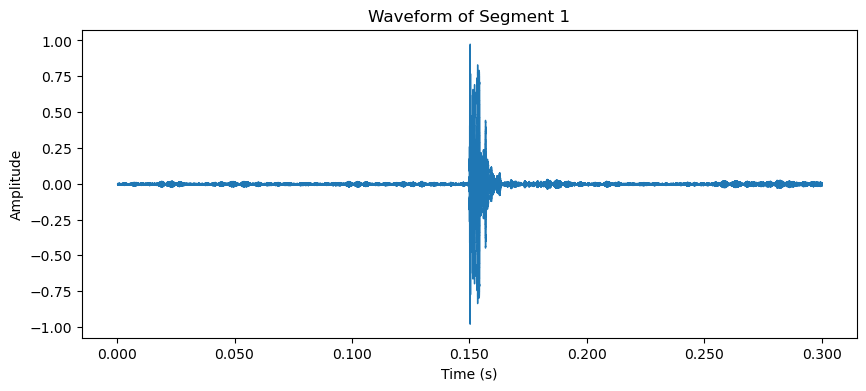

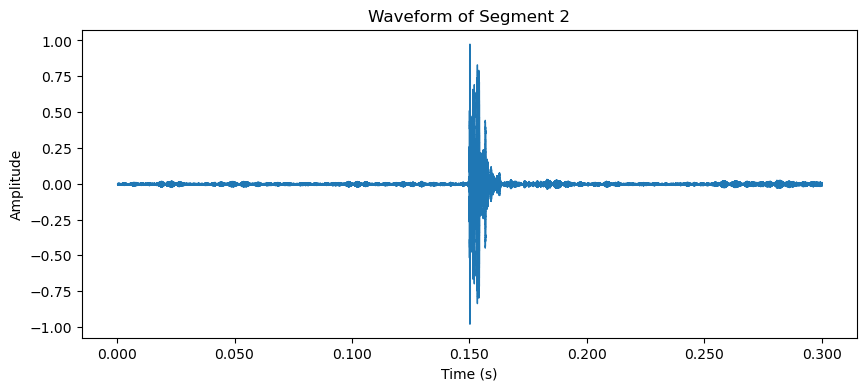

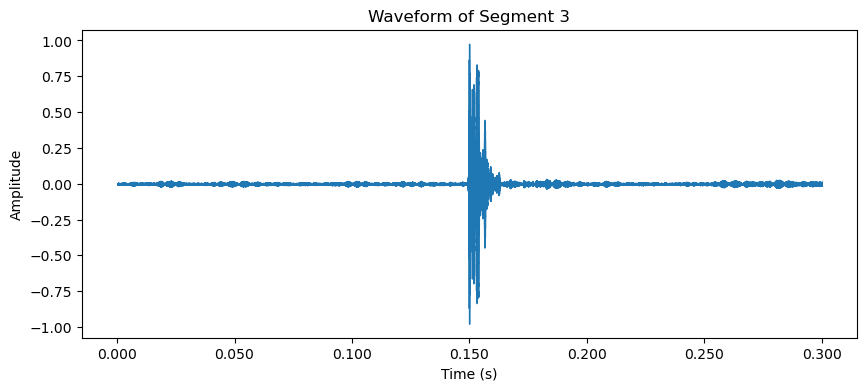

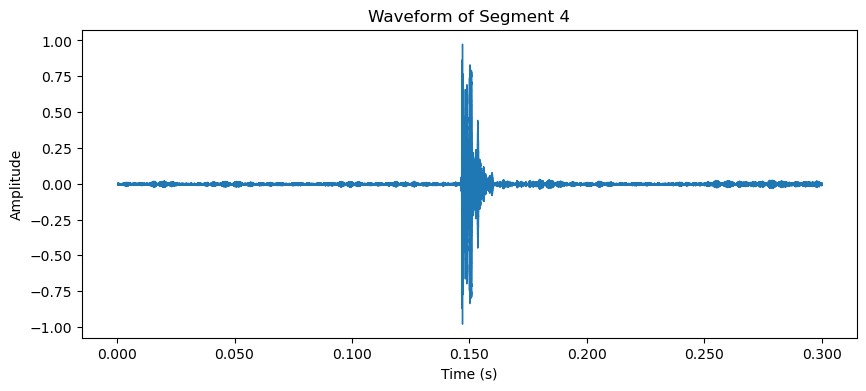

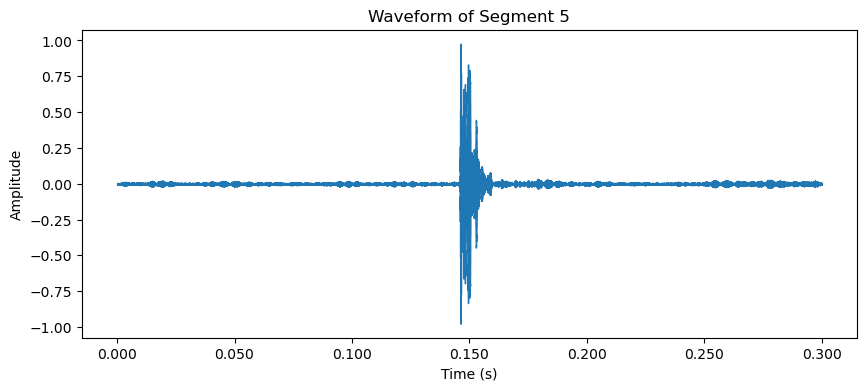

...

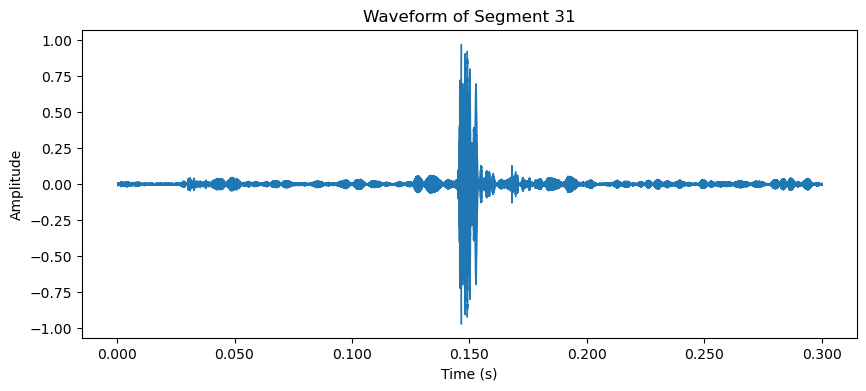

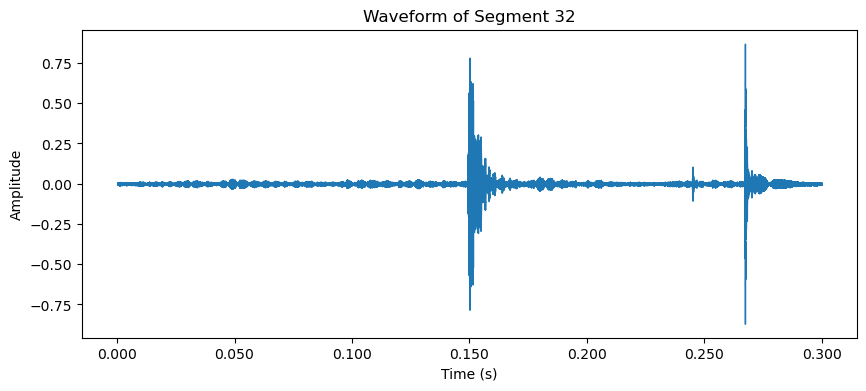

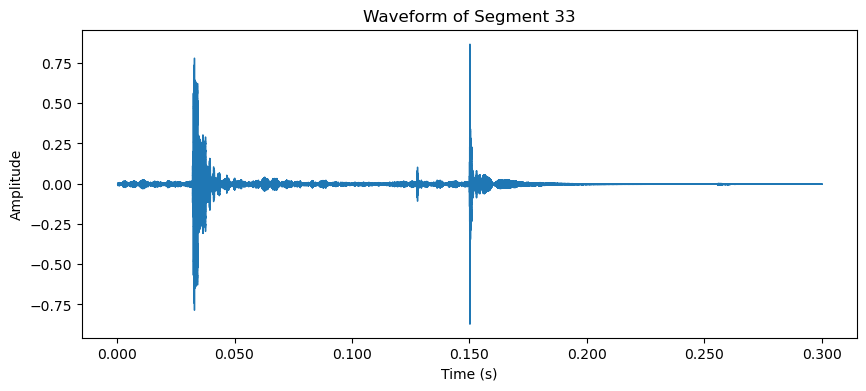

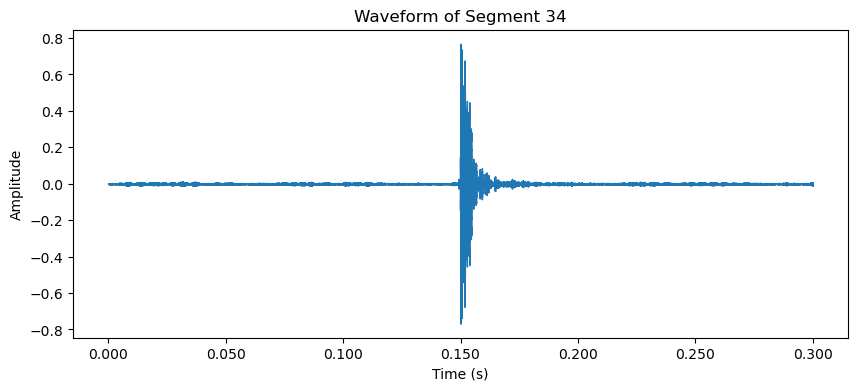

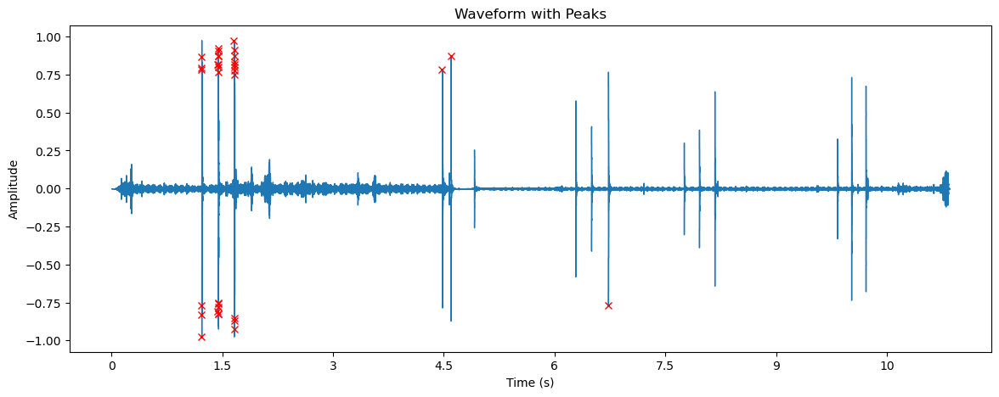

In [28]:
import librosa
import soundfile as sf  # For saving .wav files
from pydub import AudioSegment  # For converting to .m4a
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load the audio file (replace with your audio file)
audio_file = '22.m4a'
y, sr = librosa.load(audio_file, sr=None)

# Find peaks in the waveform
peaks, _ = find_peaks(np.abs(y), height=0.75)  # Adjust height for sensitivity to peaks

# Duration of the segment in seconds
segment_duration = 0.3  # 30 ms
segment_samples = int(segment_duration * sr)  # Number of samples for 0.03s

# Half the segment length (0.015s before and after the peak)
half_segment_samples = segment_samples // 2

# Extract, save, and plot each segment
segments = []
for idx, peak in enumerate(peaks):
    start = max(0, peak - half_segment_samples)
    end = min(len(y), peak + half_segment_samples)
    segment = y[start:end]
    segments.append(segment)
    
    # Save the segment to a .wav file first
    wav_filename = f"segment_{idx+1}.wav"
    sf.write(wav_filename, segment, sr)
    
#     # Convert the .wav to .m4a using pydub
#     m4a_filename = f"segment_{idx+1}.m4a"
#     audio_segment = AudioSegment.from_wav(wav_filename)
#     audio_segment.export(m4a_filename, format="m4a")
    
#     print(f"Saved {m4a_filename}")
    
    # Plot the waveform of each segment
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(segment, sr=sr)
    plt.title(f"Waveform of Segment {idx+1}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

# Optionally, plot the overall waveform with marked peaks
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.plot(peaks / sr, y[peaks], "x", color='r')  # Mark peaks with red 'x'
plt.title("Waveform with Peaks")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


In [ ]:
import librosa
import soundfile as sf  # For saving .wav files
from pydub import AudioSegment  # For converting to .m4a
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import find_peaks

# Load the audio file (replace with your audio file)
audio_file = '1.m4a'
y, sr = librosa.load(audio_file, sr=None)

# Find peaks in the waveform
peaks, _ = find_peaks(np.abs(y), height=0.75)  # Adjust height for sensitivity to peaks

# Duration of the segment in seconds
segment_duration = 0.03  # 30 ms
segment_samples = int(segment_duration * sr)  # Number of samples for 0.03s

# Half the segment length (0.015s before and after the peak)
half_segment_samples = segment_samples // 2

# Extract, save, and plot each segment
segments = []
for idx, peak in enumerate(peaks):
    start = max(0, peak - half_segment_samples)
    end = min(len(y), peak + half_segment_samples)
    segment = y[start:end]
    segments.append(segment)
    
    # Save the segment to a .wav file first
    wav_filename = f"segment_{idx+1}.wav"
    sf.write(wav_filename, segment, sr)
    
#     # Convert the .wav to .m4a using pydub
#     m4a_filename = f"segment_{idx+1}.m4a"
#     audio_segment = AudioSegment.from_wav(wav_filename)
#     audio_segment.export(m4a_filename, format="m4a")
    
#     print(f"Saved {m4a_filename}")
    
    # Plot the waveform of each segment
    plt.figure(figsize=(10, 4))
    librosa.display.waveshow(segment, sr=sr)
    plt.title(f"Waveform of Segment {idx+1}")
    plt.xlabel("Time (s)")
    plt.ylabel("Amplitude")
    plt.show()

# Optionally, plot the overall waveform with marked peaks
plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.plot(peaks / sr, y[peaks], "x", color='r')  # Mark peaks with red 'x'
plt.title("Waveform with Peaks")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.show()


In [11]:
peaks

array([ 16695,  16706,  16719,  26313,  36726,  36740,  36891,  54367,
        63923,  63976,  63999,  64085,  64106,  64113,  80580,  80598,
        80652,  80666,  90365,  90409,  90522, 108274, 108285, 108398,
       108401, 108405, 108408, 117601, 117609, 117612, 117632, 117718,
       117744, 131848, 141200, 141203, 141219, 141237, 141299, 141390],
      dtype=int64)

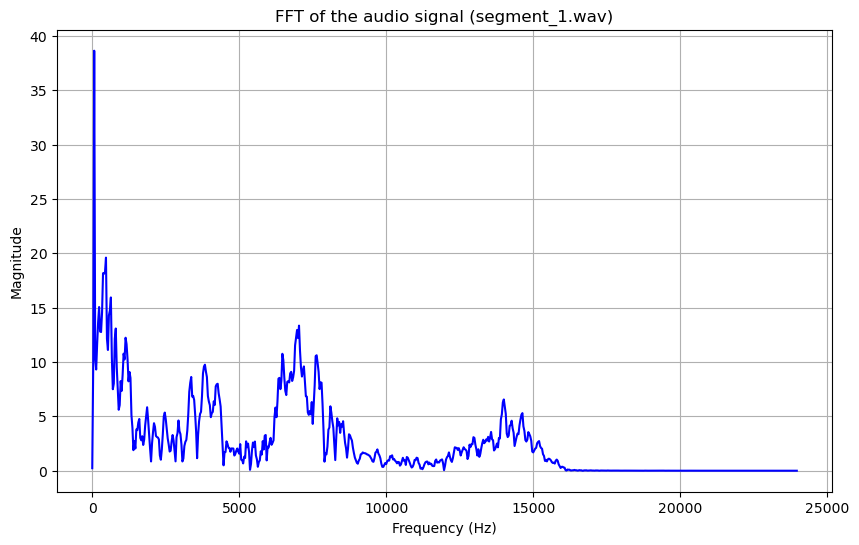

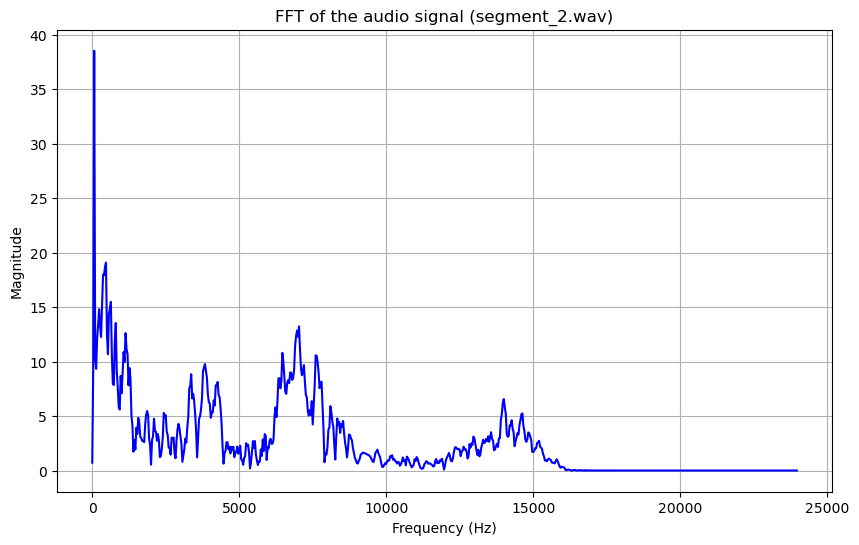

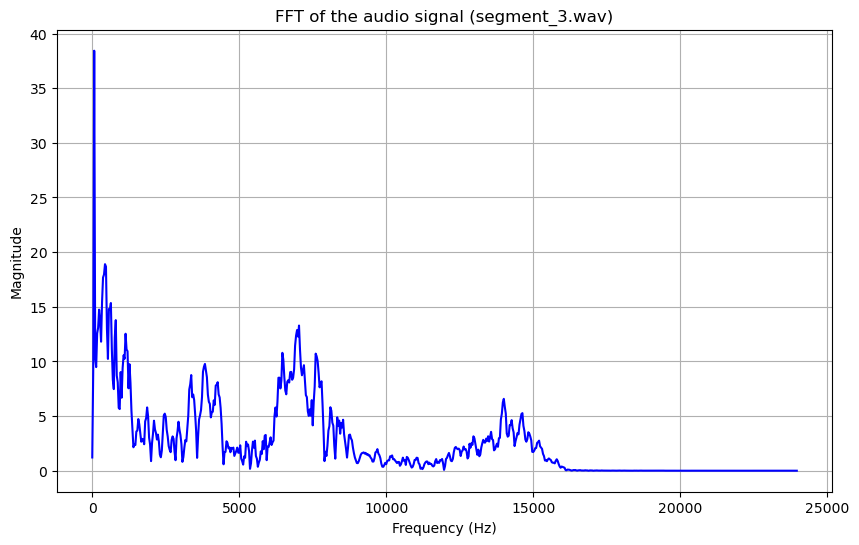

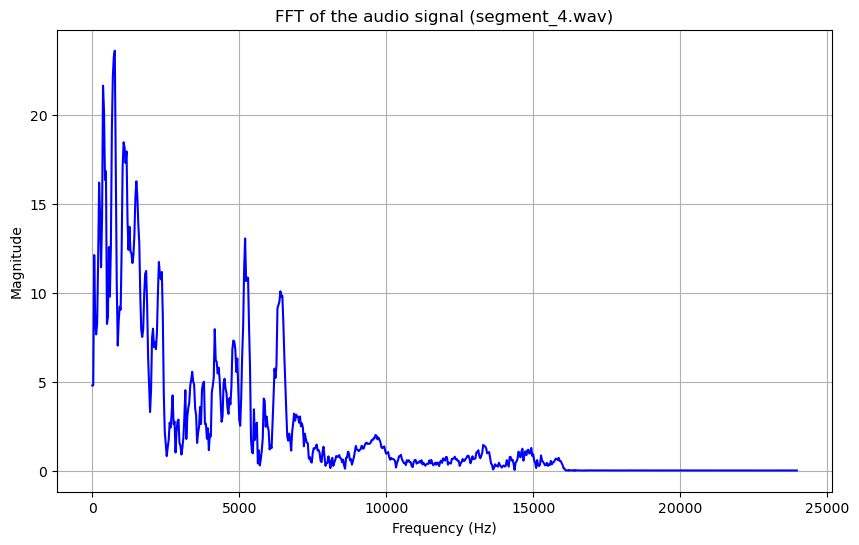

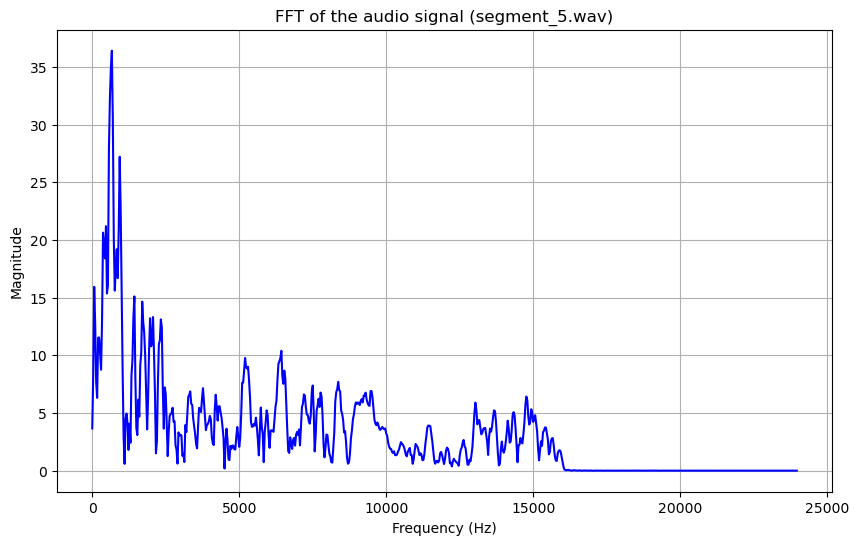

...

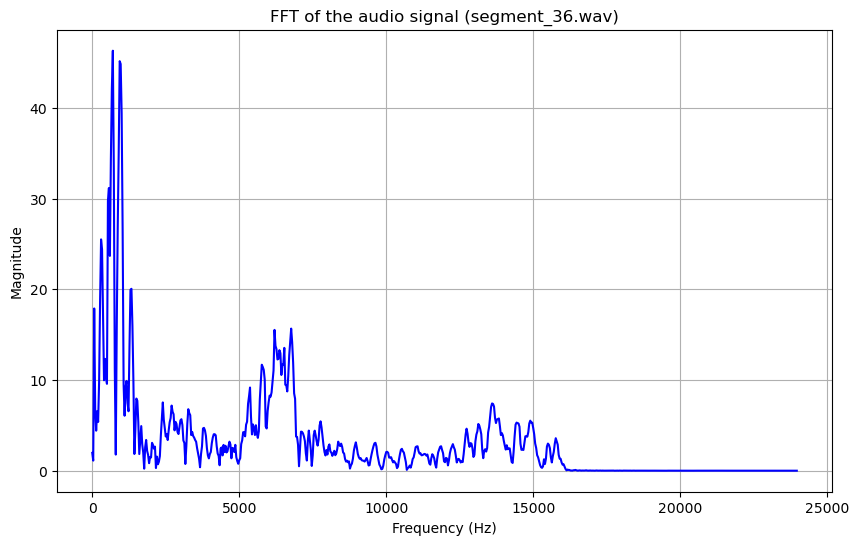

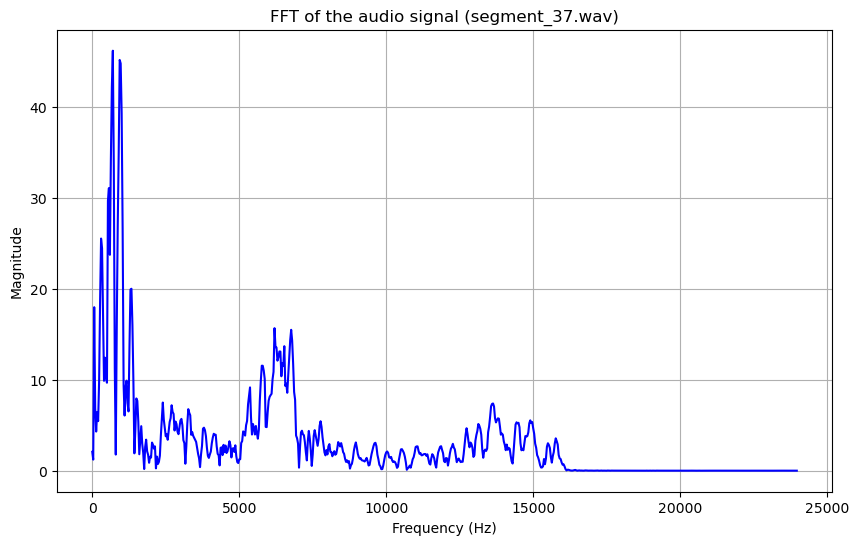

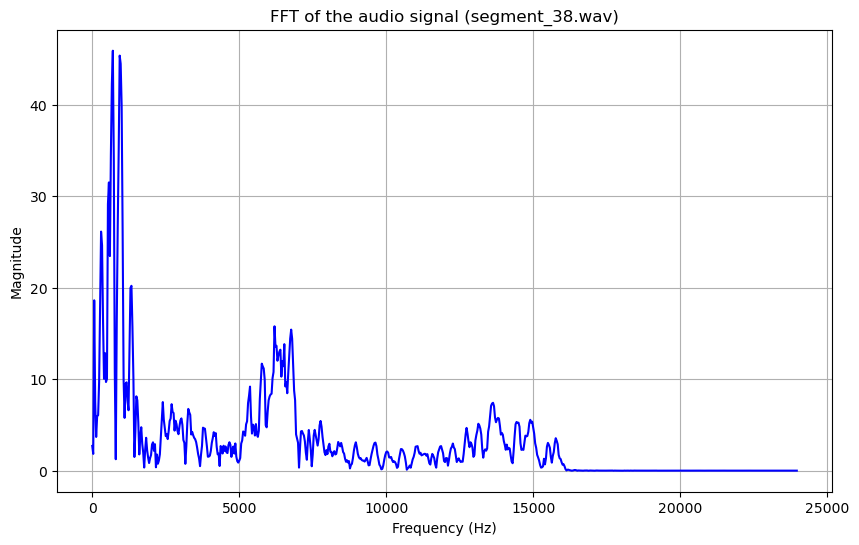

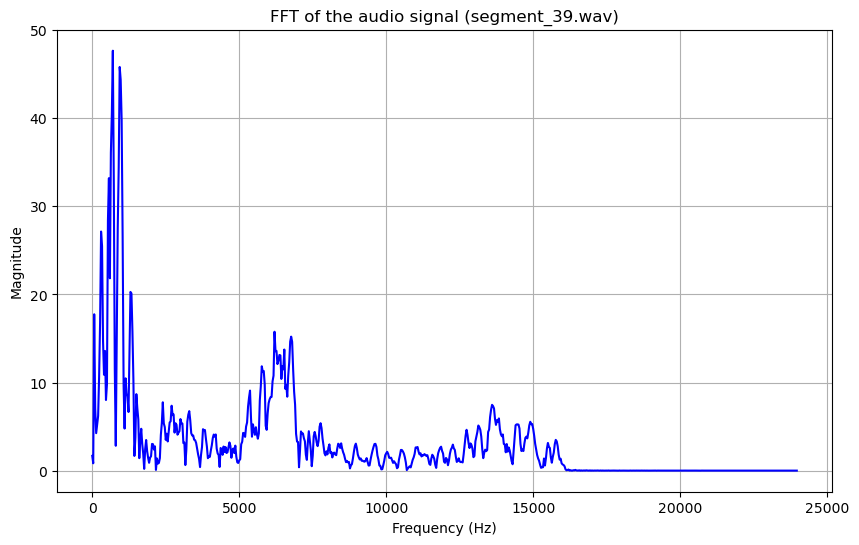

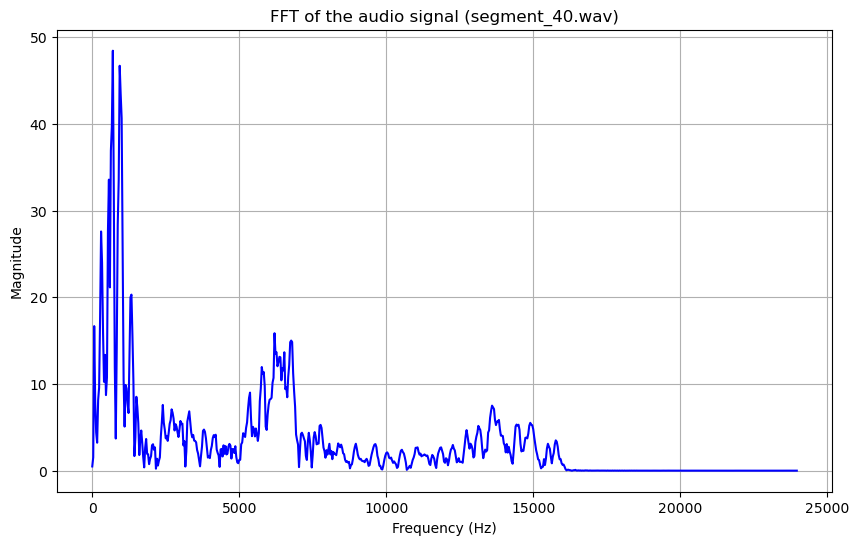

In [22]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

def plot_fft(audio_file):
    # Load the .m4a audio file
    y, sr = librosa.load(audio_file, sr=None)  # sr=None to preserve the original sample rate

    # Perform FFT on the signal
    n = len(y)  # Number of samples in the signal
    fft_values = np.fft.fft(y)  # Compute the FFT
    fft_magnitude = np.abs(fft_values)  # Magnitude of the FFT

    # Create frequency bins
    freqs = np.fft.fftfreq(n, 1/sr)

    # Only keep the positive half of the spectrum
    positive_freqs = freqs[:n // 2]
    positive_magnitude = fft_magnitude[:n // 2]

    # Plot the frequency spectrum
    plt.figure(figsize=(10, 6))
    plt.plot(positive_freqs, positive_magnitude, color='b')
    plt.title(f'FFT of the audio signal ({audio_file})')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

# Loop through the segments and plot FFT
for i in range(1, 41):  # Assuming you want to process 40 segments (1 to 40)
    audio_file = f'segment_{i}.wav'
    
    try:
        plot_fft(aud`io_file)  # Try to plot FFT for the segment
    except FileNotFoundError:
        print(f"{audio_file} not found.")


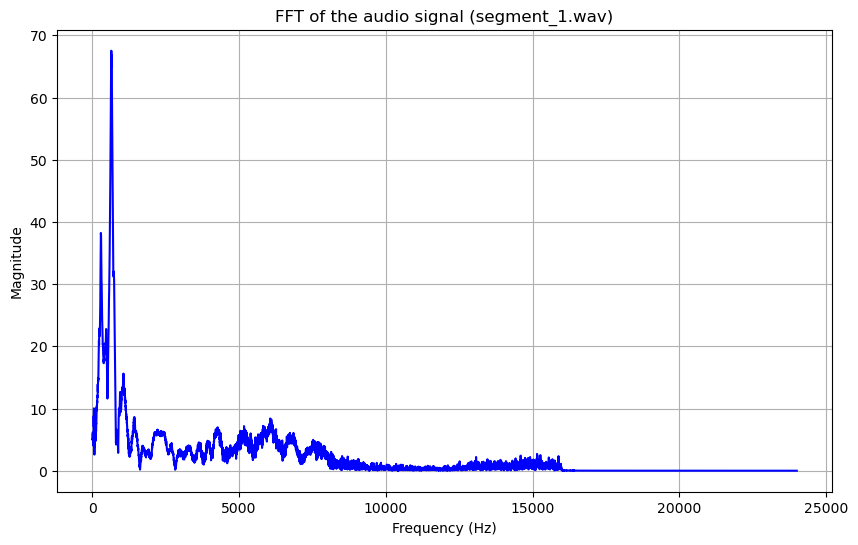

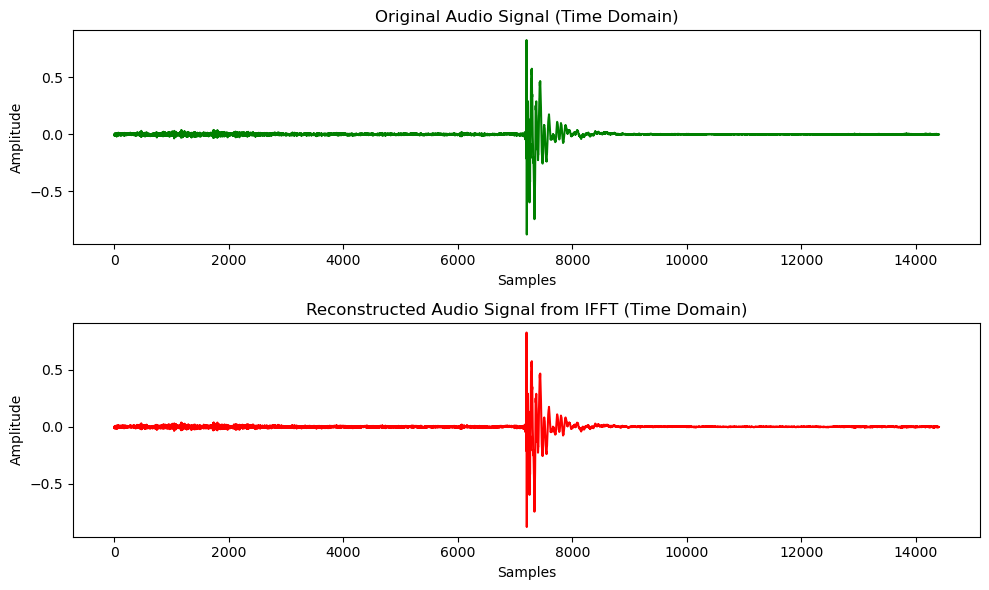

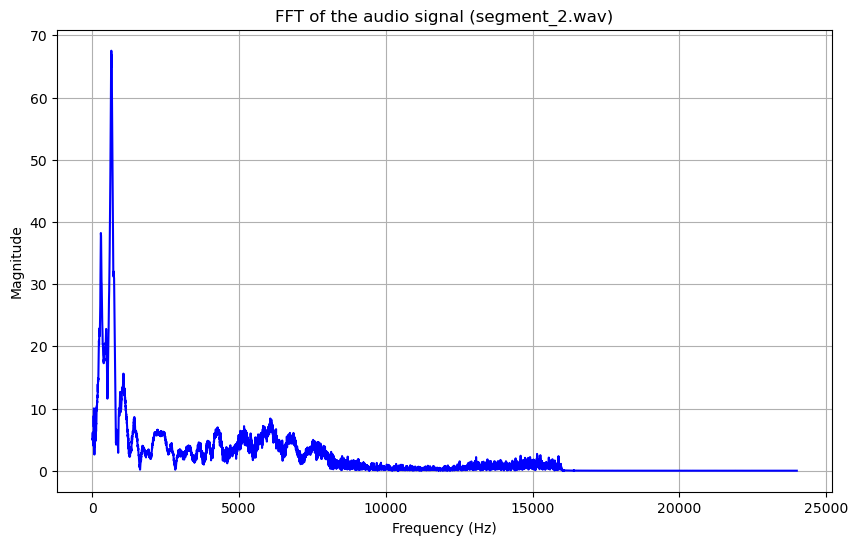

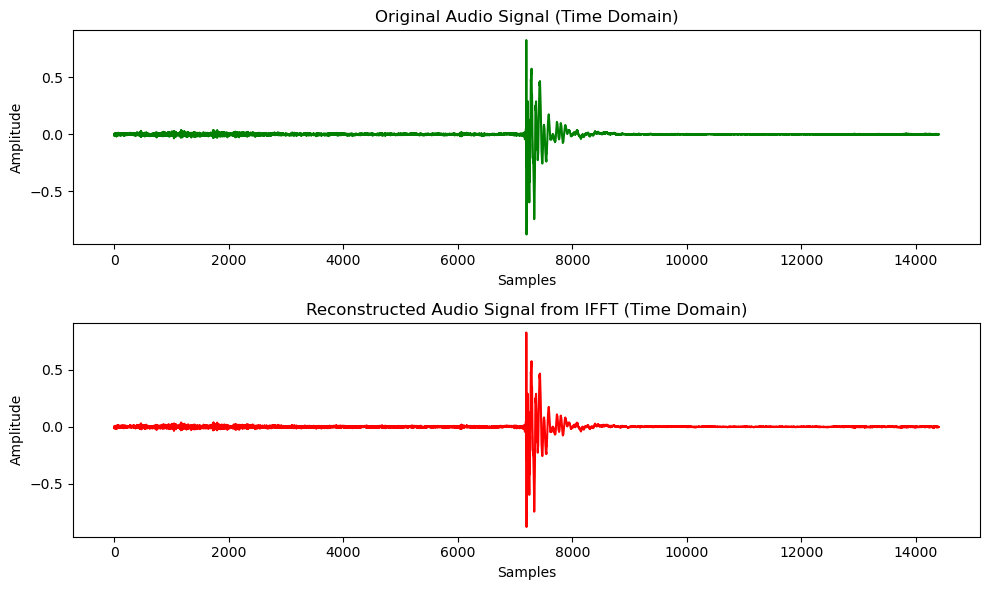

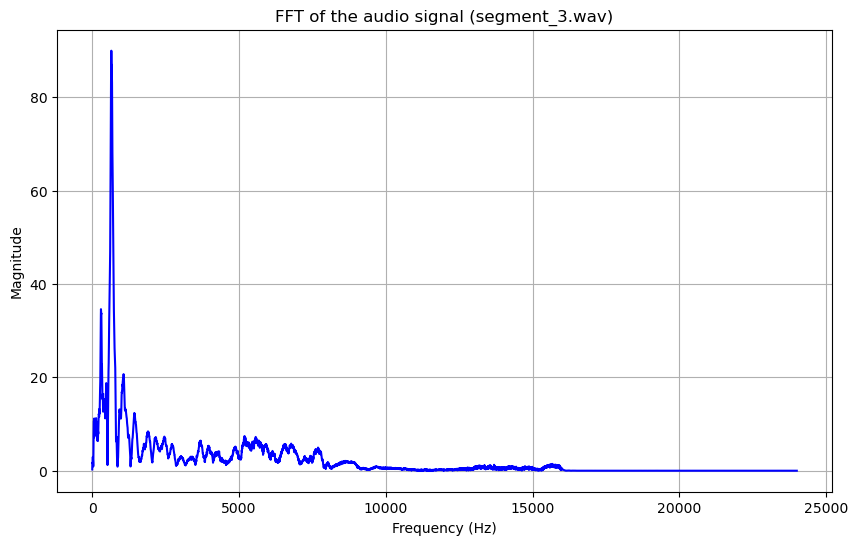

...

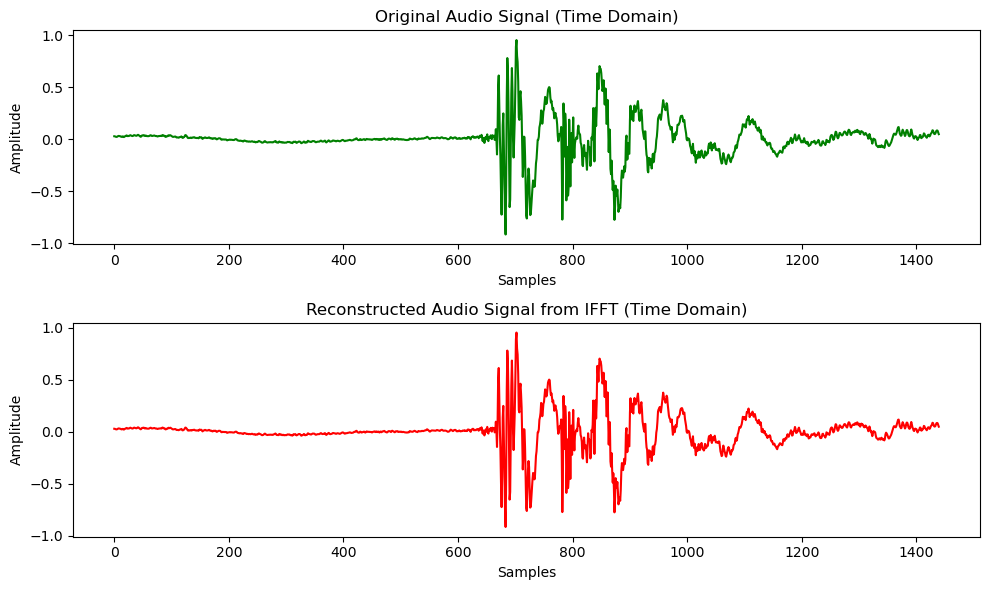

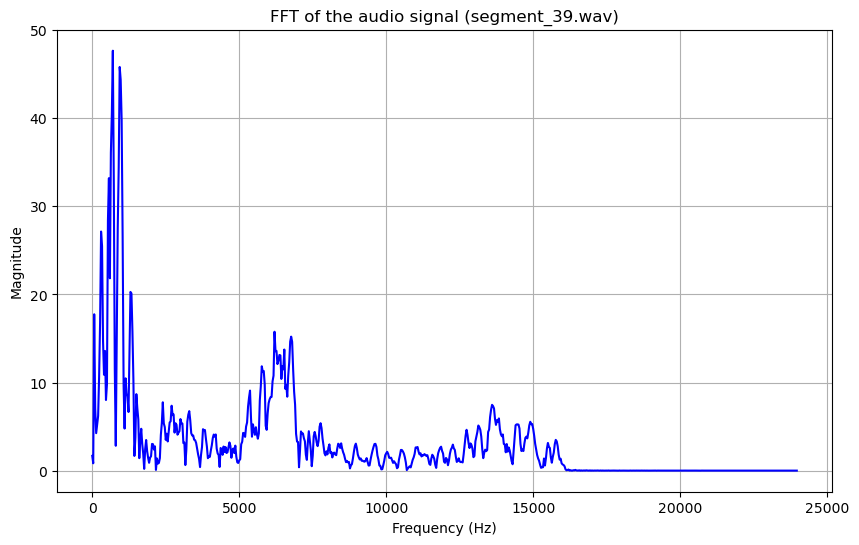

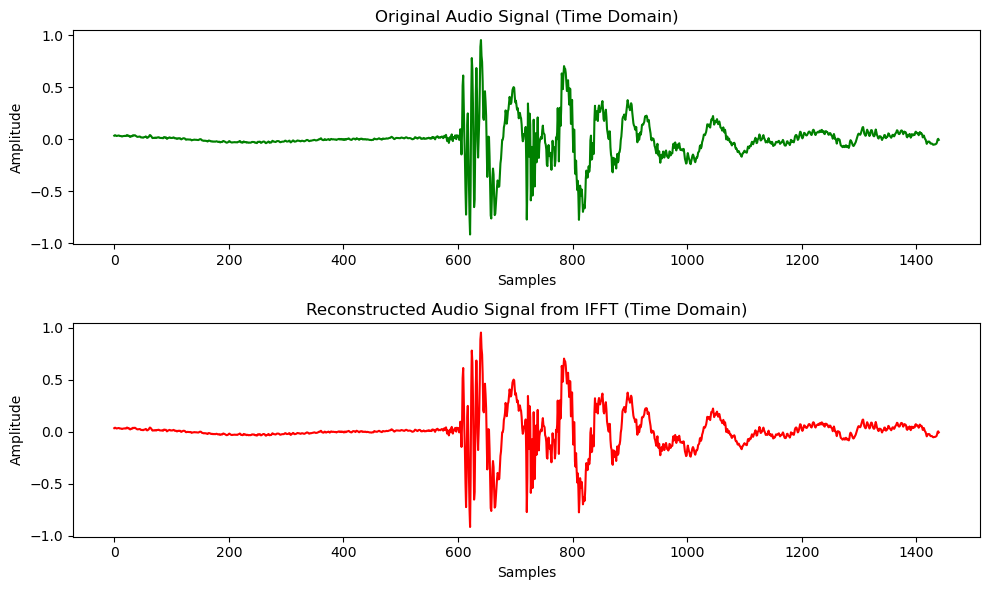

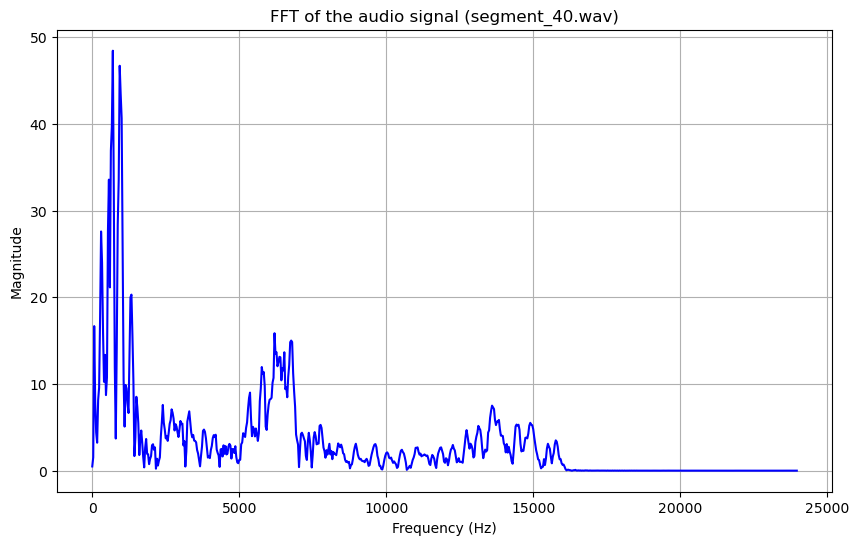

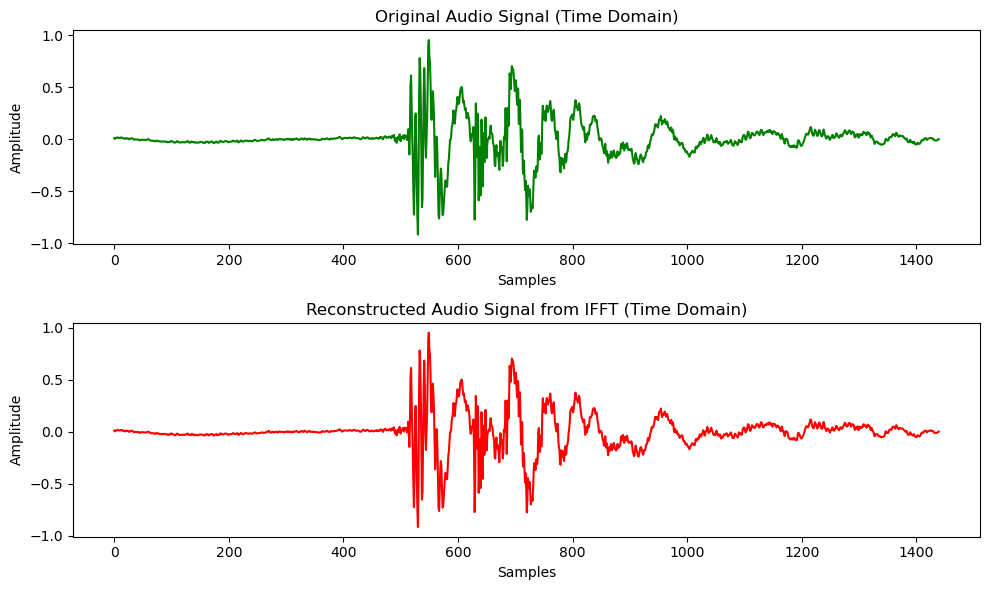

In [30]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

def plot_fft_and_ifft(audio_file):
    # Load the audio file
    y, sr = librosa.load(audio_file, sr=None)  # sr=None to preserve the original sample rate

    # Perform FFT on the signal
    n = len(y)  # Number of samples in the signal
    fft_values = np.fft.fft(y)  # Compute the FFT
    fft_magnitude = np.abs(fft_values)  # Magnitude of the FFT

    # Create frequency bins
    freqs = np.fft.fftfreq(n, 1/sr)

    # Only keep the positive half of the spectrum
    positive_freqs = freqs[:n // 2]
    positive_magnitude = fft_magnitude[:n // 2]

    # Plot the frequency spectrum (FFT)
    plt.figure(figsize=(10, 6))
    plt.plot(positive_freqs, positive_magnitude, color='b')
    plt.title(f'FFT of the audio signal ({audio_file})')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

    # Perform IFFT to reconstruct the original signal
    reconstructed_signal = np.fft.ifft(fft_values)

    # Plot the original and reconstructed signals for comparison
    plt.figure(figsize=(10, 6))

    # Plot original signal
    plt.subplot(2, 1, 1)
    plt.plot(y, color='g')
    plt.title('Original Audio Signal (Time Domain)')
    plt.xlabel('Samples')
    plt.ylabel('Amplitude')

    # Plot reconstructed signal (IFFT)
    plt.subplot(2, 1, 2)
    plt.plot(np.real(reconstructed_signal), color='r')
    plt.title('Reconstructed Audio Signal from IFFT (Time Domain)')
    plt.xlabel('Samples')
    plt.ylabel('Amplitude')

    plt.tight_layout()
    plt.show()

# Loop through the segments and plot FFT and IFFT
for i in range(1, 41):  # Assuming you want to process 40 segments (1 to 40)
    audio_file = f'segment_{i}.wav'
    
    try:
        plot_fft_and_ifft(audio_file)  # Try to plot FFT and IFFT for the segment
    except FileNotFoundError:
        print(f"{audio_file} not found.")


In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

def plot_fft(audio_file):
    # Load the .m4a audio file
    y, sr = librosa.load(audio_file, sr=None)  # sr=None to preserve the original sample rate

    # Perform FFT on the signal
    n = len(y)  # Number of samples in the signal
    fft_values = np.fft.fft(y)  # Compute the FFT
    fft_magnitude = np.abs(fft_values)  # Magnitude of the FFT

    # Create frequency bins
    freqs = np.fft.fftfreq(n, 1/sr)

    # Only keep the positive half of the spectrum
    positive_freqs = freqs[:n // 2]
    positive_magnitude = fft_magnitude[:n // 2]

    # Plot the frequency spectrum
    plt.figure(figsize=(10, 6))
    plt.plot(positive_freqs, positive_magnitude, color='b')
    plt.title(f'FFT of the audio signal ({audio_file})')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()

# Loop through the segments and plot FFT
for i in range(1, 41):  # Assuming you want to process 40 segments (1 to 40)
    audio_file = f'segment_{i}.wav'
    
    try:
        plot_fft(audio_file)  # Try to plot FFT for the segment
    except FileNotFoundError:
        print(f"{audio_file} not found.")


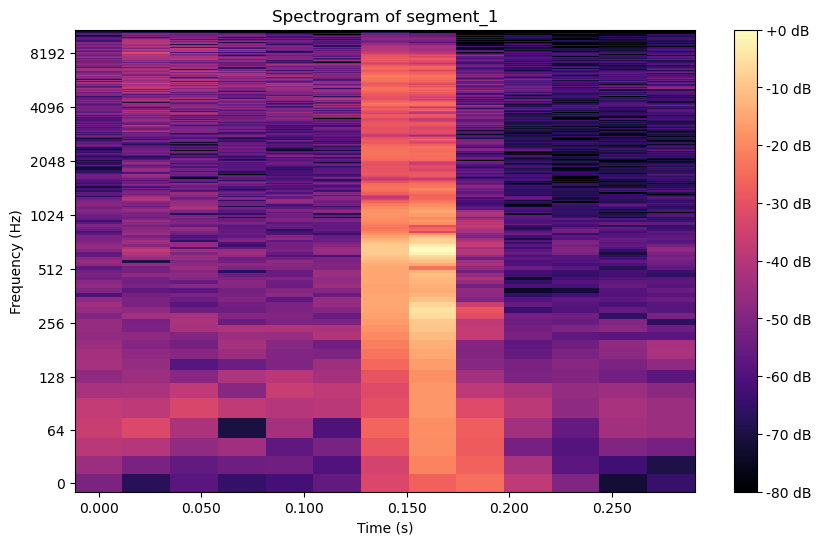

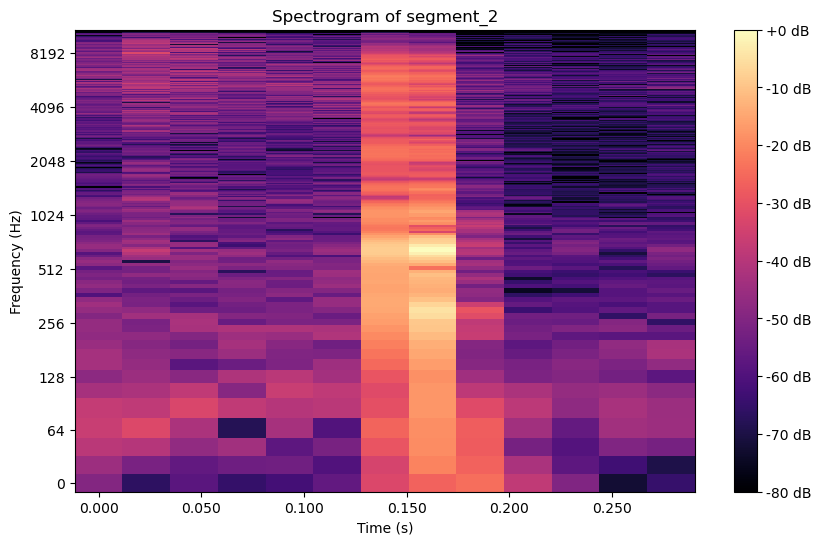

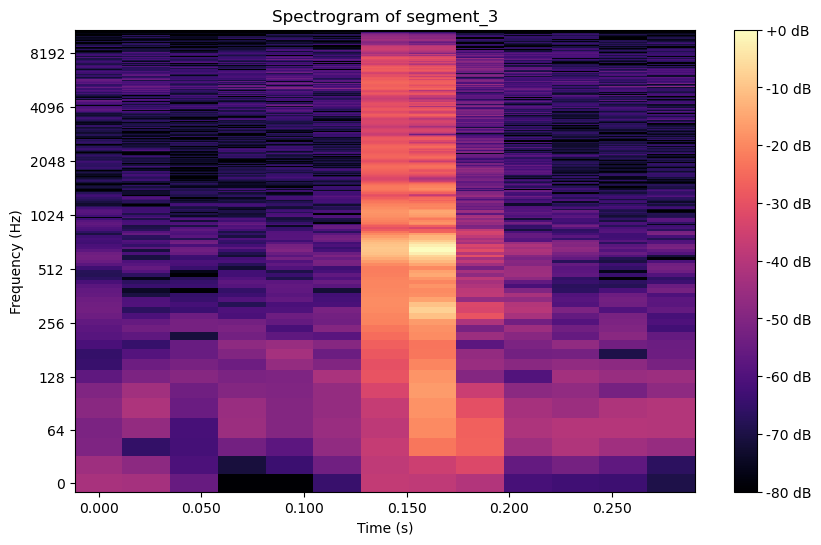

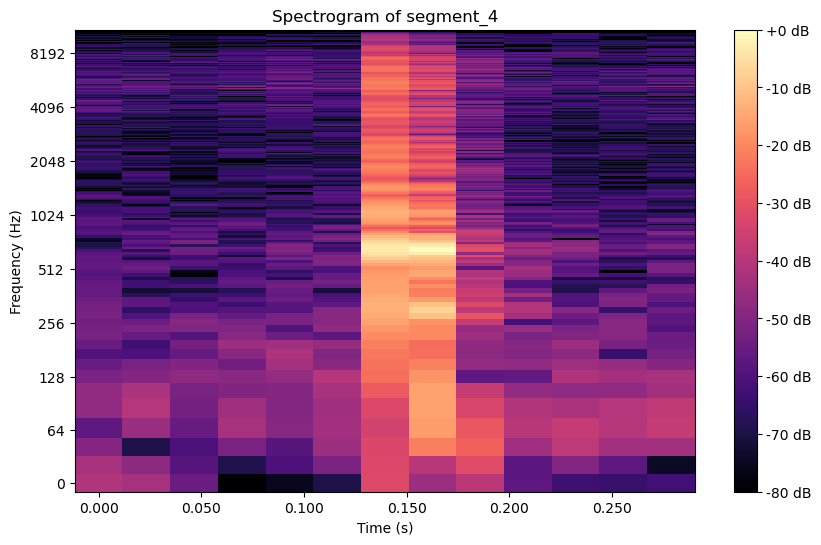

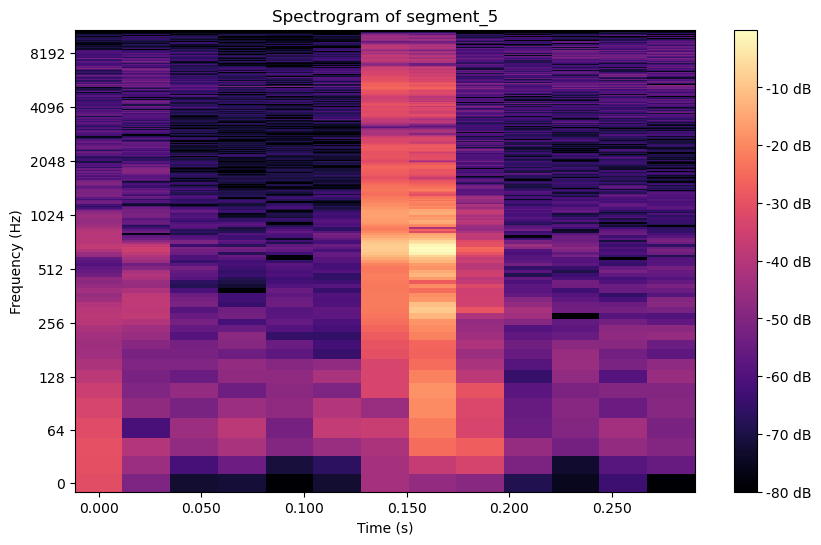

...

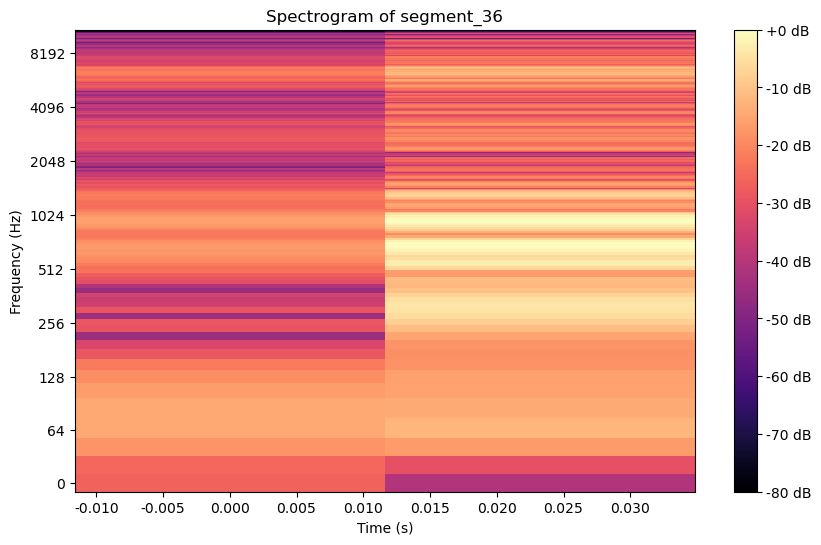

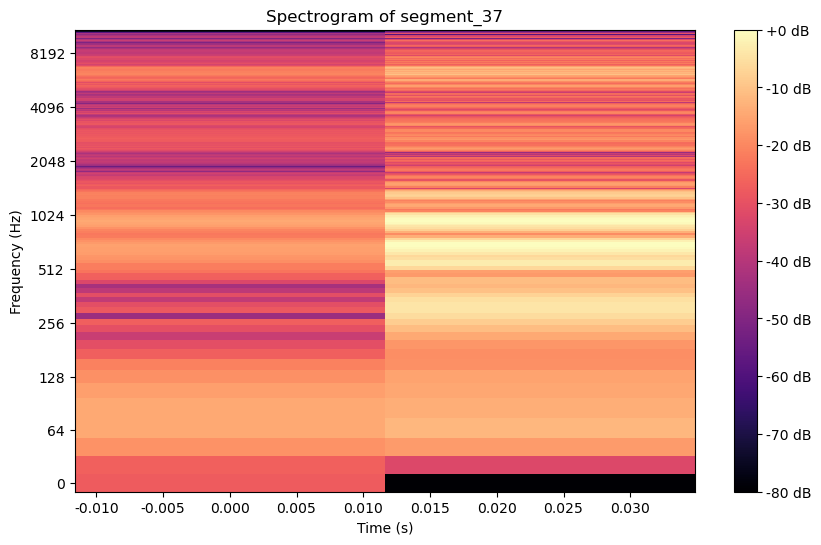

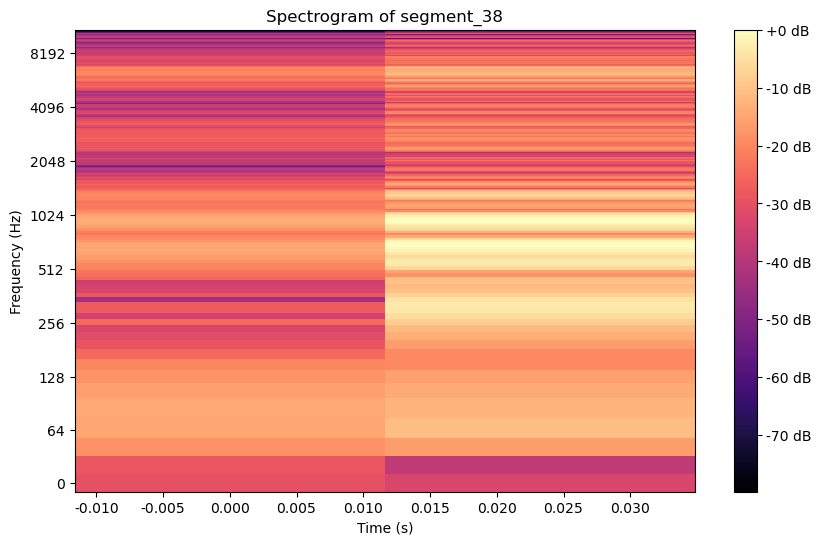

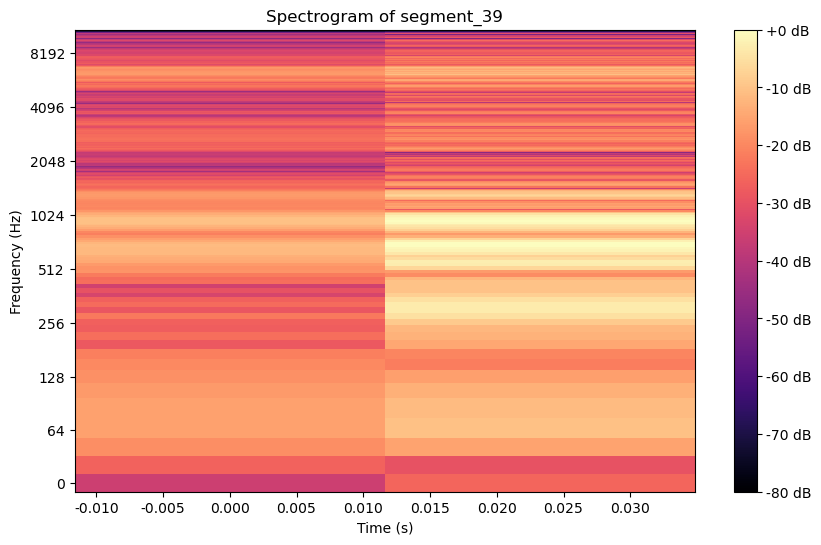

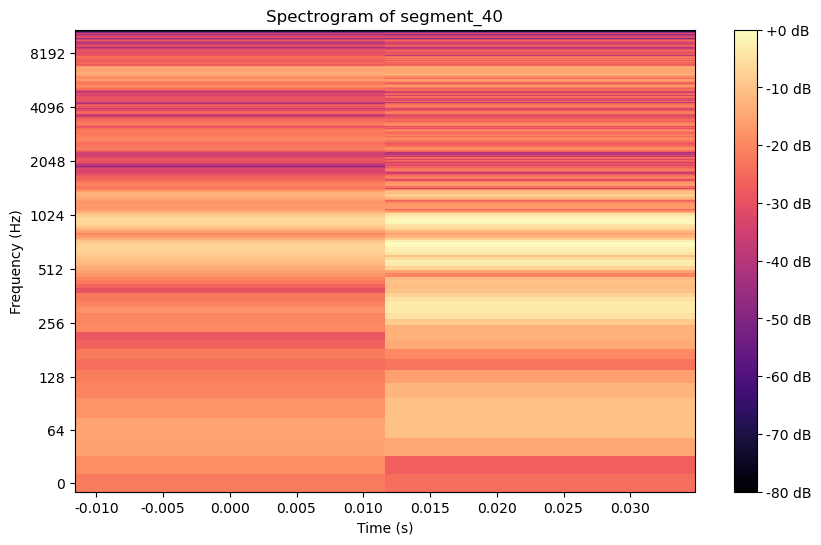

In [32]:
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt

for i in range(1, 41):
    # Load the .wav file
    y, sr = librosa.load(f'segment_{i}.wav')
    
    # Compute the STFT
    stft_values = librosa.stft(y, n_fft=1024, hop_length=512)  # You can adjust n_fft and hop_length
    stft_magnitude = np.abs(stft_values)  # Magnitude of the STFT

    # Convert magnitude to decibel scale
    log_stft = librosa.amplitude_to_db(stft_magnitude, ref=np.max)

    # Plot the spectrogram
    plt.figure(figsize=(10, 6))
    librosa.display.specshow(log_stft, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Spectrogram of segment_{i}')
    plt.xlabel('Time (s)')
    plt.ylabel('Frequency (Hz)')
    
    # Save the plot
    plt.show()
    plt.savefig(f'spectrogram_segment_{i}.png')
    plt.close()


In [ ]:
y, sr = librosa.load(audio_file, sr=None)  # sr=None to preserve the original sample rate

    # Perform FFT on the signal
    n = len(y)  # Number of samples in the signal
    fft_values = np.fft.fft(y)  # Compute the FFT
    fft_magnitude = np.abs(fft_values)  # Magnitude of the FFT

    # Create frequency bins
    freqs = np.fft.fftfreq(n, 1/sr)

    # Only keep the positive half of the spectrum
    positive_freqs = freqs[:n // 2]
    positive_magnitude = fft_magnitude[:n // 2]

    # Plot the frequency spectrum
    plt.figure(figsize=(10, 6))
    plt.plot(positive_freqs, positive_magnitude, color='b')
    plt.title(f'FFT of the audio signal ({audio_file})')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Magnitude')
    plt.grid(True)
    plt.show()
`

In [34]:
audio_file = "segment_1.wav"

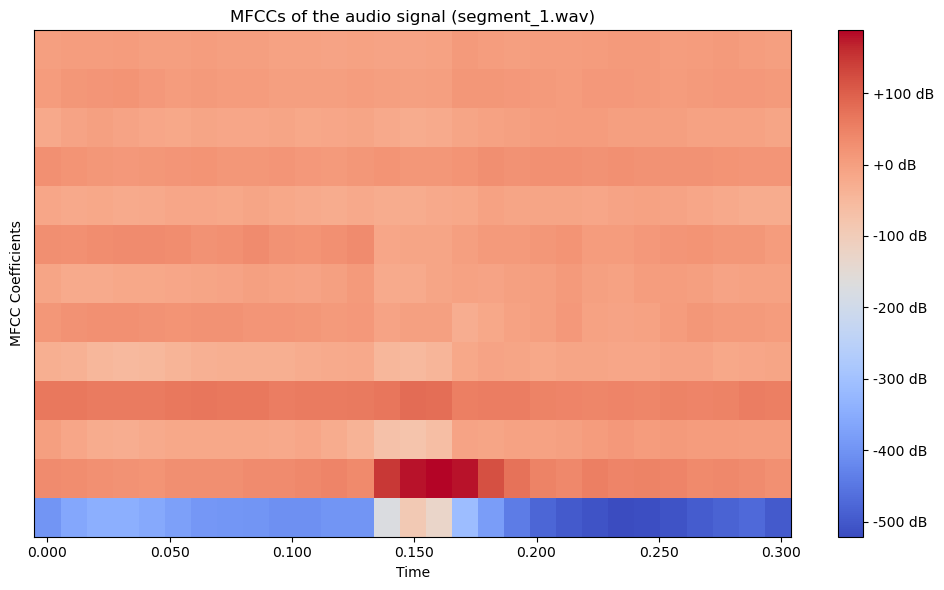

In [35]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt

# Load the audio file
y, sr = librosa.load(audio_file, sr=None)  # Load audio with the original sample rate

# Compute the MFCCs
n_mfcc = 13  # Number of MFCCs to extract (typically 13)
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=n_mfcc)

# Plot the MFCCs
plt.figure(figsize=(10, 6))
librosa.display.specshow(mfccs, x_axis='time', sr=sr)
plt.colorbar(format='%+2.0f dB')
plt.title(f'MFCCs of the audio signal ({audio_file})')
plt.xlabel('Time')
plt.ylabel('MFCC Coefficients')
plt.tight_layout()
plt.show()
